In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker

#plt.xkcd()

import pandas as pd
import time

idx = pd.IndexSlice
import datetime

,Fecha,Vacunas
0,2021-01-07,NaN
1,2021-01-08,0.000
2,2021-01-09,1.242
3,2021-01-10,0.000
4,2021-01-11,0.992
...,...,...
257,2021-09-21,5.713
258,2021-09-22,7.766
259,2021-09-23,2.925
260,2021-09-24,3.252


Fecha
2021-01-28    0.000
2021-01-29    0.000
2021-01-30    1.242
2021-01-31    0.000
2021-02-01    0.992
              ...  
2021-10-12    5.713
2021-10-13    7.766
2021-10-14    2.925
2021-10-15    3.252
2021-10-16    0.091
Name: Vacunas, Length: 262, dtype: float64

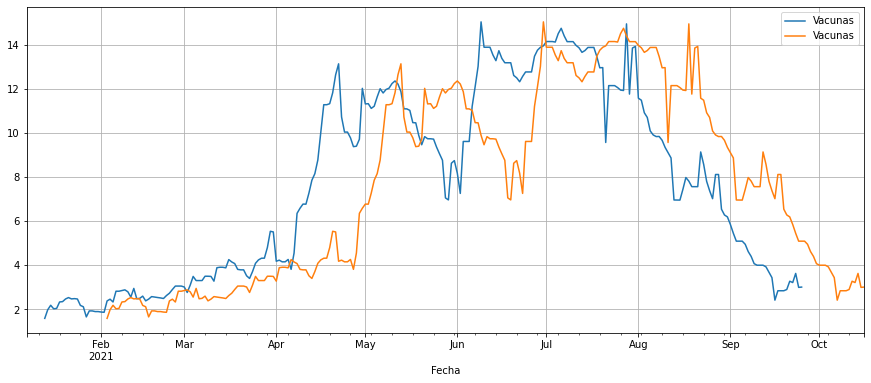

In [2]:
vacunas = pd.read_csv('Vacunas.csv',index_col='Fecha',parse_dates=True).diff()/1000.
vacunas.reset_index(inplace=True)
display(vacunas)
vacunasD = vacunas.copy()
vacunas.Fecha = vacunas.Fecha+ pd.Timedelta(21,unit='D')#21


vacunasD.set_index('Fecha',inplace=True)
vacunas.set_index('Fecha',inplace=True)
vacunasD.fillna(0,inplace=True)
vacunas.fillna(0,inplace=True)


fig, ax = plt.subplots(figsize=(15,6))
vacunasD.rolling(7,center=False).mean().plot(ax=ax)
vacunas.rolling(7,center=False).mean().plot(ax=ax)
plt.grid()
vacunas.Vacunas

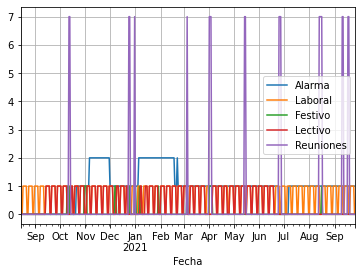

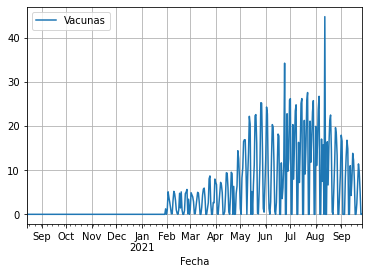

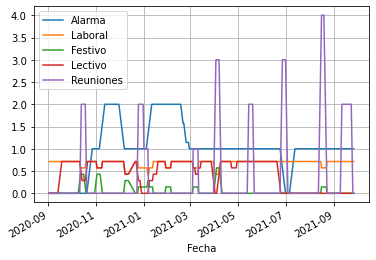

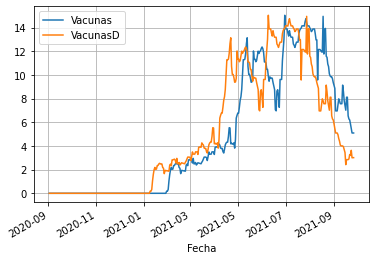

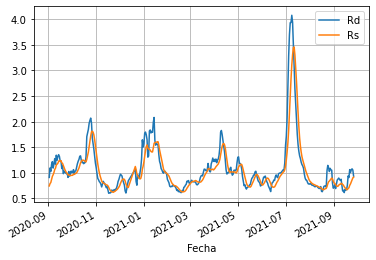

In [3]:
dateparse = lambda x: datetime.datetime.strptime(x, '%d/%m/%y')

edades = np.array([1319290,184542,123870,141711,200576,206170,176822,135180,150419])
puntos = pd.read_csv('Omega.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
puntos.sort_index(inplace=True)
puntos.columns
puntos['Asintomáticos (%)'] = puntos['Asintomáticos'].copy()
puntos['Asintomáticos'] = puntos['Asintomáticos (%)']*puntos['Casos']/100
puntos['Zaragoza (%)'] = puntos['Zaragoza']/puntos['Casos']*100
puntos['UCI/Camas (%)'] = puntos['UCI ocupadas']/puntos['Camas Ocup']*100
puntos['Camas/UCI'] = puntos['Camas Ocup']/puntos['UCI ocupadas']
puntos['Casos/Camas'] = puntos['Casos']/puntos['Camas Ocup']
puntos['Camas/Casos'] = puntos['Camas Ocup']/puntos['Casos']
puntos['Camas (%)'] = puntos['Camas Ocup']/(puntos['Camas libres'])*100.
puntos['UCI (%)'] = puntos['UCI ocupadas']/(puntos['UCI libres con resp'])*100.
puntos['Día'] = np.sin((puntos['Día de la semana']-.5)*2*np.pi /7)#.plot()
puntos['Rs'] = puntos.Casos.rolling(7,center=False).sum()/puntos.Casos.shift(7).rolling(7,center=False).sum()
puntos['Rd'] = puntos.Casos/puntos.Casos.shift(7)
puntos['Bias'] = 1
puntos['Festivo'] = 0
puntos['Lectivo'] = 1
puntos.loc['2021/6/21':,'Lectivo'] = 0

#goto
#puntos.loc['2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
#puntos.loc['2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']
puntos.loc['2020/10/10':'2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
puntos.loc['2020/10/31':'2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']

puntos.loc['2020/12/7':'2020/12/8',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2020/12/25',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2021/1/1',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/6',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/29',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/3/5',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/4/1':'2021/4/4',
           'Festivo'] = 1
puntos.loc['2021-04-23':'2021-04-24','Festivo'] = 0
puntos.loc['2021-08-16','Festivo'] = 1

puntos['Laboral'] = 1 - puntos.Festivo/1
puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0


#puntos.loc['2020/10/10':'2020/10/14','Laboral'] = 0
#puntos.loc['2020/10/31':'2020/11/2','Laboral'] = 0


puntos.loc['2020/10/10':'2020/10/14','Lectivo'] = 0
puntos.loc['2020/10/31':'2020/11/2','Lectivo'] = 0
puntos.loc[:'2020/9/13','Lectivo'] = 0
puntos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
puntos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
puntos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
puntos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
puntos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
puntos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0
puntos.loc['2021/1/29':'2021/1/30','Lectivo'] = 0
puntos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
puntos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
puntos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
puntos.loc['2021/6/21':,'Lectivo'] = 0

puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

puntos['NoLaboral'] = 1 - puntos.Laboral
puntos['NoLectivo'] = 1 - puntos.Lectivo

puntos['Reuniones'] = 0
puntos.loc['2020/10/12':'2020/10/13','Reuniones'] = 7
#puntos.loc['2020/10/12','Reuniones'] = 1
puntos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
#puntos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
puntos.loc['2020/12/31','Reuniones'] = 7
puntos.loc['2021/3/5','Reuniones'] = 7
puntos.loc['2021-04-01':'2021-04-03',
           'Reuniones'] = 7
puntos.loc['2021-05-14':'2021-05-15',
           'Reuniones'] = 7
puntos.loc['2021-06-25':'2021-06-27',
           'Reuniones'] = 7
#puntos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#puntos.loc['2021/7/9':'2021/7/11','Reuniones'] = 7
#puntos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#puntos.loc['2021/7/23':'2021/7/25','Reuniones'] = 7
#puntos.loc['2021/7/30':'2021/8/1','Reuniones'] = 7
#puntos.loc['2021/8/6':'2021/8/8','Reuniones'] = 7
puntos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
#puntos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7
#puntos.loc['2021/8/27':'2021/8/28','Reuniones'] = 7
#puntos.loc['2021/9/3':'2021/9/4','Reuniones'] = 7
puntos.loc['2021/9/10':'2021/9/11','Reuniones'] = 7
puntos.loc['2021/9/17':'2021/9/18','Reuniones'] = 7

puntos.loc[:,'VacunasD'] = 0.
for i in puntos.index:
    if i in vacunasD.index:
        puntos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
puntos.loc[:,'Vacunas'] = 0.
for i in puntos.index:
    if i in vacunas.index:
        puntos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
puntos.loc[:,'Inoculados'] = (edades[0]-1000*puntos.Vacunas.cumsum()/2.45)*100./edades[0]# + puntos.Casos.cumsum()
puntos.loc[:,'Total Casos'] = (edades[0]-puntos.Casos.cumsum()-21313)*100./edades[0] # +21.313

puntos = pd.concat([puntos,(edades[1:]*.983-puntos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos '))/edades[1:]*100.],#/edades*100.],
         axis=1)
#puntos = pd.concat([puntos,puntos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')/edades[1:]*100.],#/edades*100.],
#         axis=1)

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas'
      ]].plot()

plt.grid()
plt.show()


semanal = puntos.rolling(7,center=False).mean().copy()
diario = puntos.copy()
puntos = puntos.rolling(7,center=False).mean().copy().dropna()

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas',
        'VacunasD',
      ]].plot()

plt.grid()
plt.show()


puntos[['Rd','Rs'
      ]].plot()

plt.grid()
plt.show()
#puntos['Día'] = diario['Día']
#puntos['Alarma'] = diario.Alarma
#puntos['Festivo'] = diario['Festivo']
#puntos['Laboral'] = diario['Laboral']
#puntos['Reuniones'] = diario['Reuniones']
#puntos['Bias'] = diario['Bias']

In [4]:
diario.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-22,3,83,2454,1969.0,3.38,48.14,67,18,8,9,...,41.688456,87.791843,89.002929,81.272471,86.188026,89.104483,88.644861,89.236083,91.211673,89.000643
2021-09-23,4,87,2279,1717.0,3.82,53.94,61,19,8,6,...,41.395287,87.785248,88.992634,81.266013,86.183792,89.098999,88.641951,89.229296,91.205755,88.991336
2021-09-24,5,85,2581,1755.0,3.29,41.65,59,13,4,17,...,41.234811,87.778805,88.985589,81.262784,86.171795,89.094512,88.635645,89.229296,91.197618,88.980034
2021-09-25,6,52,1322,911.0,3.93,26.00,45,12,4,4,...,41.234811,87.774864,88.979087,81.259554,86.168973,89.091520,88.632250,89.228165,91.195399,88.971391
2021-09-26,7,41,1149,668.0,3.57,22.14,29,11,2,3,...,41.234718,87.771756,88.973126,81.257940,86.166856,89.090025,88.629825,89.224772,91.192440,88.967402


In [5]:
nuevos = pd.read_csv('Omega_new.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
nuevos.sort_index(inplace=True)
nuevos.columns
#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
nuevos['Asintomáticos (%)'] = nuevos['Asintomáticos'].copy()
nuevos['Asintomáticos'] = nuevos['Asintomáticos (%)']*nuevos['Casos']/100
nuevos['Zaragoza (%)'] = nuevos['Zaragoza']/nuevos['Casos']*100
nuevos['UCI/Camas (%)'] = nuevos['UCI ocupadas']/nuevos['Camas Ocup']*100
nuevos['Camas/UCI'] = nuevos['Camas Ocup']/nuevos['UCI ocupadas']
nuevos['Casos/Camas'] = nuevos['Casos']/nuevos['Camas Ocup']
nuevos['Camas/Casos'] = nuevos['Camas Ocup']/nuevos['Casos']
nuevos['Camas (%)'] = nuevos['Camas Ocup']/(nuevos['Camas libres'])*100.
nuevos['UCI (%)'] = nuevos['UCI ocupadas']/(nuevos['UCI libres con resp'])*100.
nuevos['Día'] = np.sin((nuevos['Día de la semana']-.5)*2*np.pi /7)#.plot()
nuevos['Bias'] = 1
nuevos['Rs'] = nuevos.Casos.rolling(7,center=False).sum()/nuevos.Casos.shift(7).rolling(7,center=False).sum()
nuevos['Rd'] = nuevos.Casos/nuevos.Casos.shift(7)
nuevos['Festivo'] = 0
nuevos['Lectivo'] = 1

#nuevos.loc['2021/6/21':,'Lectivo'] = 0

#nuevos.loc['2020/12/7':'2020/12/8',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2020/12/25',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2021/1/1',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/1/6',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/3/5',
#           'Festivo'] = 1
#nuevos.loc['2021/4/1':'2021/4/4',
#           'Festivo'] = 1
#nuevos.loc['2021-04-23','Festivo'] = 0
#nuevos.loc['2021-08-16','Festivo'] = 1
nuevos['Laboral'] = 1# - nuevos.Festivo/1
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0

#nuevos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
#nuevos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
#nuevos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0

#nuevos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
#nuevos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
#nuevos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

#nuevos.loc[:'2020/9/13','Lectivo'] = 0

nuevos['NoLaboral'] = 1 - nuevos.Laboral
nuevos['NoLectivo'] = 1 - nuevos.Lectivo



nuevos['Reuniones'] = 0 
#nuevos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
##nuevos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
#nuevos.loc['2020/12/31','Reuniones'] = 7
##nuevos.loc['2020/12/24','Reuniones'] = 1
##nuevos.loc['2020/12/25','Reuniones'] = 1
##nuevos.loc['2020/12/31','Reuniones'] = 1
#nuevos.loc['2021/4/1':'2021/4/3','Reuniones'] = 7
#nuevos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#nuevos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#nuevos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
## esperemos que rterminen no fiestas por un tiempo 
#nuevos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7



nuevos.loc[:,'VacunasD'] = np.nan
for i in nuevos.index:
    if i in vacunasD.index:
        nuevos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
nuevos.loc[:,'Vacunas'] = np.nan
for i in nuevos.index:
    if i in vacunas.index:
        nuevos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
nuevos.loc[:,'Inoculados'] = diario.Inoculados.iat[-1] - 1000.*nuevos.Vacunas.cumsum()/2.45*100/edades[0]
nuevos.loc[:,'Total Casos'] = diario['Total Casos'].iat[-1]-nuevos.Casos.cumsum()*100./edades[0]

nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]-nuevos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'
                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
         axis=1)
#nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]+nuevos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más'
#                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
#         axis=1)


nuevos.tail(10).T


Fecha,2021-09-27,2021-09-28
Día de la semana,1.000000,2.000000
Casos,85.000000,NaN
test coresp,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,NaN,NaN
Tasa de positividad (%),NaN,NaN
Asintomáticos,NaN,NaN
Zaragoza,NaN,NaN
1 a 14 años,NaN,NaN
15 a 24 años,NaN,NaN
25 a 34 años,NaN,NaN


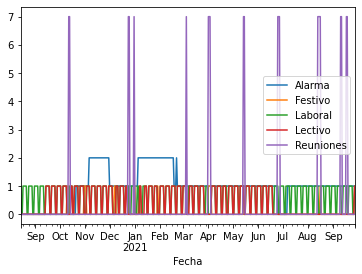

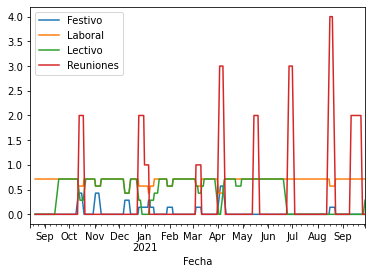

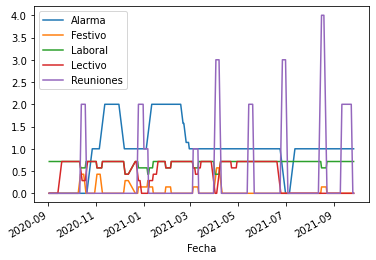

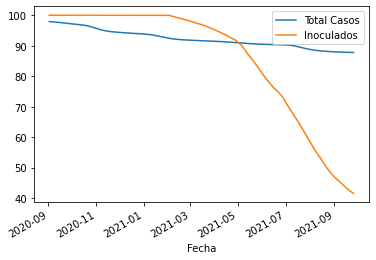

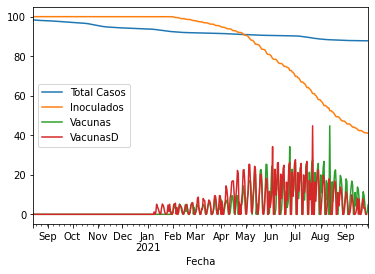

In [6]:
total = pd.concat([diario,nuevos])
total[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
total[[
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].rolling(7,center=False).mean().plot()
plt.show()
puntos[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
puntos[['Total Casos',
       'Inoculados',
      ]].plot()
plt.show()
total[['Total Casos',
       'Inoculados',
       'Vacunas',
       'VacunasD',
      ]].plot()
plt.show()

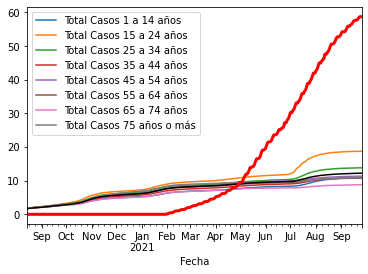

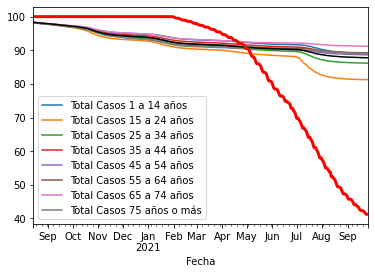

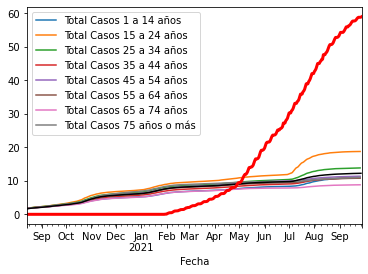

,Total Casos,Inoculados
Fecha,,
2020-08-14,98.337212,100.000000
2020-08-15,98.300677,100.000000
2020-08-16,98.271116,100.000000
2020-08-17,98.241099,100.000000
2020-08-18,98.205702,100.000000
...,...,...
2021-09-24,87.778805,41.234811
2021-09-25,87.774864,41.234811
2021-09-26,87.771756,41.234718


,Total Casos,Inoculados
Fecha,,
2021-09-27,87.765313,41.18992
2021-09-28,NaN,41.04086


In [7]:
(100.-diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100.-diario['Total Casos']).plot(color='k')
(100.-diario['Inoculados']).plot(color='r',lw=3)
plt.show()
(diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(diario['Total Casos']).plot(color='k')
(diario['Inoculados']).plot(color='r',lw=3)
plt.show()

(100-total[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100-total['Total Casos']).plot(color='k')
(100-total['Inoculados']).plot(color='r',lw=3)
plt.show()
display(total[['Total Casos','Inoculados']])
display(nuevos[['Total Casos','Inoculados']])

In [8]:

total = pd.concat([diario,nuevos])
nuevos['Rs'] = (total.Casos.rolling(7,center=False).sum()/total.Casos.shift(7).rolling(7,center=False).sum()).loc[nuevos.index]
nuevos['Rd'] = (total.Casos/total.Casos.shift(7)).loc[nuevos.index]

nuevos


,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-27,1,85.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,41.18992,87.765313,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-28,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,41.04086,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
display(total.columns)
edades = [1319290,184542,123870,141711,200576,206170,176822,135180,150419]
pd.concat([total,total[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')],#/edades*100.],
         axis=1)

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 65 a 74 años,Total Casos 75 años o más,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,5,624.0,4177.0,3481.0,14.94,318.24,541.0,96.0,78.0,85.0,...,98.264492,98.264765,96.0,78.0,85.0,84.0,85.0,87.0,48.0,53.0
2020-08-15,6,482.0,3243.0,1907.0,14.86,216.90,428.0,67.0,51.0,64.0,...,98.240080,98.227536,163.0,129.0,149.0,167.0,152.0,144.0,81.0,109.0
2020-08-16,7,390.0,3158.0,1168.0,12.35,230.10,338.0,53.0,54.0,38.0,...,98.209750,98.208256,216.0,183.0,187.0,237.0,203.0,196.0,122.0,138.0
2020-08-17,1,396.0,3408.0,3189.0,11.62,233.64,307.0,51.0,41.0,40.0,...,98.182379,98.177010,267.0,224.0,227.0,299.0,264.0,250.0,159.0,185.0
2020-08-18,2,467.0,4029.0,3580.0,11.59,270.86,394.0,49.0,50.0,72.0,...,98.153529,98.150418,316.0,274.0,299.0,371.0,340.0,315.0,198.0,225.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-24,5,85.0,2581.0,1755.0,3.29,41.65,59.0,13.0,4.0,17.0,...,91.197618,88.980034,17189.0,21104.0,17187.0,18464.0,19925.0,16039.0,9601.0,14019.0
2021-09-25,6,52.0,1322.0,911.0,3.93,26.00,45.0,12.0,4.0,4.0,...,91.195399,88.971391,17201.0,21108.0,17191.0,18470.0,19932.0,16041.0,9604.0,14032.0
2021-09-26,7,41.0,1149.0,668.0,3.57,22.14,29.0,11.0,2.0,3.0,...,91.192440,88.967402,17212.0,21110.0,17194.0,18473.0,19937.0,16047.0,9608.0,14038.0


In [10]:
variables = [
    'Casos', 
    'test coresp', 'Tasa de positividad (%)',
    'Nº de pacientes a los que se ha realizado pruebas',
    'Asintomáticos', 'Asintomáticos (%)',
    'Zaragoza','Zaragoza (%)',
    '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 
    'Camas Ocup', 'Camas libres', 'Camas (%)',
    'UCI ocupadas', 'UCI libres con resp','UCI (%)',
    'Rs',
    'Rd',
    #'UCI/Camas (%)',
    #'Camas/UCI',
    #'Casos/Camas',
    #'Camas/Casos',
    #'Alarma',
    #'Día', 
    #'Bias',
    'Inoculados',
    'Total Casos',
    'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'
]
entradas = ['Alarma','Laboral','Lectivo','Reuniones','Festivo','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias',
            'Vacunas',#'VacunasD'
            #'Inoculados'
           ]



In [11]:
def find_weekend_indices(datetime_array):
    indices=[]
    for i in range(len(datetime_array)):
        #if datetime_array[i].day_name() in ['Saturday', 'Sunday']:
        if datetime_array[i].weekday()+1 in [6,7]:
            indices.append(i)
    return indices

weekend_indices = find_weekend_indices(puntos.index)

def highlight_datetimes(index, ax,items=True):
    indices = find_weekend_indices(index)
    i = 0
    while i < len(indices):
        ax.axvspan(index[indices[i]], index[indices[i] + 1], facecolor='gray', edgecolor='none', alpha=.05)
        i += 1
    if items:
        ax.axvline(x=datetime.datetime(2020, 3, 8),ls='--',linewidth=4, color='purple',alpha=.4,label='Manifestación y Vox')
        ax.axvline(x=datetime.datetime(2020, 3, 9),linewidth=4, color='green',alpha=.4,label='PV y MD Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 12),linewidth=4, color='yellow',alpha=.4,label='AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 15),linewidth=4, color='r',alpha=.4,label='Estado de alarma')
        ax.axvline(x=datetime.datetime(2020, 3, 28),linewidth=4, color='brown',alpha=.4,label='Servicios no esenciales')
        ax.axvline(x=datetime.datetime(2020, 4, 26),ls='--',linewidth=4, color='orange',alpha=.4,label='Niños a la calle')
        ax.axvline(x=datetime.datetime(2020, 5, 4),ls='--',linewidth=4, color='lightblue',alpha=.4,label='Fase 0')
        ax.axvline(x=datetime.datetime(2020, 5, 11),ls='--',linewidth=4, color='blue',alpha=.4,label='Fase 1')
        ax.axvline(x=datetime.datetime(2020, 5, 25),ls='--',linewidth=4, color='darkblue',alpha=.4,label='Fase 2')
        ax.axvline(x=datetime.datetime(2020, 6, 8),ls='--',linewidth=4, color='lightgreen',alpha=.4,label='Fase 3')
        ax.axvline(x=datetime.datetime(2020, 6, 21),ls='--',linewidth=4, color='black',alpha=.4,label='Nueva Normalidad')
        ax.axvline(x=datetime.datetime(2020, 9, 14),linewidth=4, color='yellow',alpha=.4,label='Apertura AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 10, 25),linewidth=4, color='darkred',alpha=.4,label='Nivel III')
        ax.axvline(x=datetime.datetime(2020, 11, 8),linewidth=4, color='brown',alpha=.4,label='nivel III Agravado')



In [12]:
repartoDiaSemana = diario[['Día de la semana']].join(diario[variables].divide(
                                                                    diario[variables].rolling(7,center=True).mean())
                                                    ).dropna().groupby(['Día de la semana']).mean()

#diario['Camas Ocup'] = diario['Camas Ocup'].diff()
#diario['UCI ocupadas'] = diario['UCI ocupadas'].diff()
#semanal['Camas Ocup'] = semanal['Camas Ocup'].diff()
#semanal['UCI ocupadas'] = semanal['UCI ocupadas'].diff()
repartoDiaSemana.loc[:,'Total Casos'] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()
repartoDiaSemana.loc[:,'Inoculados'] = 1
repartoDiaSemana.loc[:,['Rs','Rd']] = 1
#repartoDiaSemana.loc[:,['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()


display(repartoDiaSemana)
repartoDiaSemana.mean()

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Día de la semana,,,,,,,,,,,,,,,,,,,,,
1,0.843069,0.929643,0.915738,1.234668,0.819106,0.962560,0.771472,0.919027,0.722861,0.777198,...,1,1,1.000110,1.000201,1.000119,1.000093,1.000090,1.000083,1.000050,1.000061
2,1.200898,1.208236,0.990414,1.252405,1.169961,0.972404,1.207175,1.001508,1.274571,1.172193,...,1,1,1.000059,1.000127,1.000061,1.000039,1.000044,1.000035,1.000033,1.000041
3,1.187075,1.216621,0.979934,1.216906,1.173749,0.989154,1.210118,1.020724,1.207064,1.246785,...,1,1,1.000007,1.000014,1.000004,0.999989,0.999994,0.999990,1.000009,1.000021
4,1.202291,1.122862,1.076860,1.113526,1.229395,1.025102,1.209848,1.012136,1.209684,1.247619,...,1,1,0.999953,0.999894,0.999937,0.999955,0.999952,0.999957,0.999972,0.999963
5,1.129432,1.111871,1.024801,1.143701,1.084533,0.959970,1.137217,1.015189,1.172684,1.176310,...,1,1,0.999900,0.999793,0.999882,0.999914,0.999912,0.999923,0.999943,0.999938
6,0.850510,0.824082,1.042376,0.589141,0.934185,1.092850,0.891214,1.047128,0.916736,0.821104,...,1,1,0.999921,0.999867,0.999925,0.999953,0.999947,0.999956,0.999960,0.999951
7,0.549928,0.563973,0.962337,0.431464,0.554982,0.999377,0.539722,0.984833,0.467116,0.514153,...,1,1,1.000042,1.000086,1.000061,1.000050,1.000053,1.000048,1.000026,1.000020


Casos                                                0.994743
test coresp                                          0.996755
Tasa de positividad (%)                              0.998923
Nº de pacientes a los que se ha realizado pruebas    0.997401
Asintomáticos                                        0.995130
Asintomáticos (%)                                    1.000202
Zaragoza                                             0.995252
Zaragoza (%)                                         1.000078
1 a 14 años                                          0.995817
15 a 24 años                                         0.993623
25 a 34 años                                         0.993068
35 a 44 años                                         0.993897
45 a 54 años                                         0.995222
55 a 64 años                                         0.994839
65 a 74 años                                         0.992894
75 años o más                                        0.990707
Camas Oc

In [13]:
diario.Casos.shift(0).rolling(7,center=False).sum()/diario.Casos.shift(7).rolling(7,center=False).sum()

Fecha
2020-08-14         NaN
2020-08-15         NaN
2020-08-16         NaN
2020-08-17         NaN
2020-08-18         NaN
                ...   
2021-09-22    0.875740
2021-09-23    0.948800
2021-09-24    0.975042
2021-09-25    0.958472
2021-09-26    0.911576
Name: Casos, Length: 409, dtype: float64

In [14]:
nuevos.Casos/nuevos.Casos.shift(1)

Fecha
2021-09-27   NaN
2021-09-28   NaN
Name: Casos, dtype: float64

In [15]:

#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
#puntos['Camas Ocup'] = puntos['Camas Ocup'].diff()
#puntos['UCI ocupadas'] = puntos['UCI ocupadas'].diff()
total = pd.concat([diario,nuevos])
#puntos = total.rolling(7,center=False).mean().copy().dropna()
diario[variables].divide(semanal[variables]).head(10)#.columns

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-20,0.815867,0.921760,0.890012,1.155124,0.869139,1.054545,0.768627,0.949875,0.789216,0.821229,...,1.0,0.999097,0.999189,0.998890,0.998782,0.999159,0.999125,0.999140,0.999293,0.999205
2020-08-21,0.702324,0.856468,0.822585,1.047753,0.810898,1.140351,0.682390,0.977908,0.813031,0.656958,...,1.0,0.999185,0.999241,0.999015,0.998849,0.999302,0.999257,0.999243,0.999359,0.999193
2020-08-22,1.267818,1.317408,0.963189,0.531530,1.342138,1.057554,1.304977,1.033834,1.180233,1.302839,...,1.0,0.999105,0.999192,0.998901,0.998877,0.999235,0.999189,0.999158,0.999273,0.999093


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,272.000000,2633.857143,10.348571,2139.714286,159.558571,58.571429,204.000000,74.923581,29.571429,29.142857,...,100.000000,97.920635,97.891498,97.727626,97.735773,97.873870,97.875039,97.836661,97.917019,97.847645
2020-09-04,260.142857,2490.428571,10.432857,2164.571429,154.922857,59.714286,192.714286,74.085108,27.857143,29.000000,...,100.000000,97.900916,97.876403,97.704214,97.713394,97.858201,97.856191,97.815574,97.900850,97.824566
2020-09-05,281.000000,2562.000000,10.852857,2109.428571,173.357143,60.571429,216.000000,76.118888,30.714286,32.285714,...,100.000000,97.879617,97.859760,97.678150,97.689401,97.841535,97.835473,97.794407,97.883518,97.798259
2020-09-06,287.428571,2528.428571,11.450000,2229.857143,169.327143,57.285714,224.000000,77.348069,31.571429,32.142857,...,100.000000,97.857830,97.842652,97.652201,97.665509,97.824156,97.813785,97.771543,97.866927,97.771761
2020-09-07,279.142857,2458.285714,11.434286,2277.000000,162.124286,56.142857,215.428571,76.327781,30.000000,30.142857,...,100.000000,97.836672,97.826395,97.627867,97.642928,97.807561,97.792652,97.749406,97.851497,97.743554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-22,84.571429,1931.857143,4.472857,1709.000000,48.507143,57.571429,58.857143,67.823586,15.714286,6.142857,...,42.225758,87.812102,89.033352,81.286080,86.210405,89.120295,88.659481,89.251271,91.218437,89.037492
2021-09-23,84.714286,1986.714286,4.370000,1671.285714,48.964286,58.000000,59.000000,67.873229,17.142857,6.000000,...,42.057203,87.805681,89.024063,81.281236,86.203752,89.115309,88.655185,89.246586,91.215478,89.025906
2021-09-24,83.714286,2069.142857,4.184286,1617.142857,48.342857,57.857143,57.714286,67.230189,16.428571,5.285714,...,41.899648,87.799336,89.015160,81.276969,86.196796,89.110466,88.650681,89.242304,91.211885,89.014319


<AxesSubplot:xlabel='Fecha'>

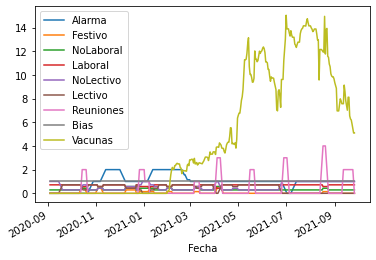

In [16]:


#entradas = ['Alarma','Festivo','Laboral','Lectivo','Reuniones','Bias']
X_prima = puntos[variables].iloc[1:].T
Omega       = puntos[variables+entradas].shift(1).iloc[1:].T
display(X_prima.T)
display(Omega.T[entradas].plot())


In [17]:
%%time 
Omega_pinv = pd.DataFrame(np.linalg.pinv(Omega),index=Omega.columns,columns=Omega.index)#.shape
Omega_pinv

CPU times: user 27.6 ms, sys: 9.4 ms, total: 37 ms
Wall time: 5.93 ms


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,0.000703,0.000003,-0.009194,-9.664665e-05,-0.000507,0.002867,-0.000779,-0.001241,-0.000189,0.000906,...,0.896743,0.024800,0.025970,-3.066339,-2.826577,-2.944928,-2.947987,0.001304,-5.892916,0.003758
2020-09-04,0.000785,0.000056,-0.002588,-8.896536e-05,-0.000504,0.001662,-0.000677,-0.000306,-0.001064,0.000073,...,0.766127,0.017325,-0.012679,-4.619319,-4.516808,-4.566139,-4.569988,0.003411,-9.136127,0.001060
2020-09-05,0.001220,-0.000007,-0.008048,-4.195144e-05,-0.000683,0.003689,-0.000708,-0.000355,-0.000445,0.000352,...,0.552345,0.027063,0.032231,-1.344464,-1.191417,-1.256184,-1.279698,-0.001148,-2.535882,0.003054
2020-09-06,0.000378,-0.000009,-0.008102,-7.135053e-05,-0.000383,0.002548,-0.000011,0.000061,0.000158,0.000562,...,0.432628,0.015849,0.033941,-1.650297,-1.515566,-1.580053,-1.585809,-0.001037,-3.165863,0.001158
2020-09-07,0.000277,-0.000006,-0.001411,-2.449241e-06,-0.000042,0.000162,0.000396,0.001462,-0.000968,-0.000351,...,0.251570,0.007022,0.038288,-1.480582,-1.410440,-1.429527,-1.461495,-0.000721,-2.891022,-0.002652
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-22,0.000117,-0.000018,-0.006521,1.305966e-06,-0.000862,0.003015,0.000373,-0.002176,0.001021,-0.000395,...,-0.340381,0.022743,-0.051906,1.867819,1.824803,1.841815,1.850807,0.004186,3.692622,0.001531
2021-09-23,0.000509,0.000019,-0.001300,9.834091e-07,-0.000923,0.003618,-0.000028,-0.000577,0.000231,-0.000748,...,-0.445509,0.021197,-0.046849,2.411873,2.362447,2.383128,2.391192,0.003735,4.774320,0.000418
2021-09-24,0.000941,0.000051,0.002059,-3.035543e-05,-0.001093,0.004074,-0.000383,0.000515,0.000674,-0.001134,...,-0.571637,0.021116,-0.057416,2.081685,2.014384,2.040070,2.056000,0.004205,4.096069,-0.000592



$$ X' = G_{nx(n+q)} \Omega \Leftrightarrow G_{nx(n+q)} = X'\Omega^\dagger $$

In [18]:
celdas = X_prima.index


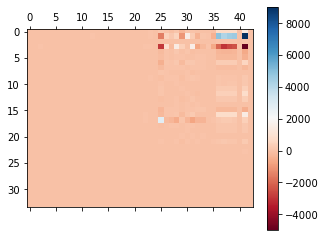

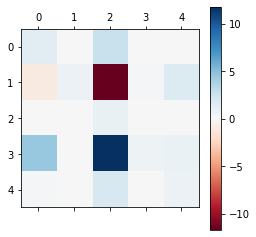

In [19]:
G = X_prima.dot( Omega_pinv)
plt.matshow(G, cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()
plt.matshow(G.iloc[:5,:5], cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()

Step 1
------

$$\Omega = \tilde U \tilde \Sigma \tilde V^* $$

In [20]:
%%time
U_tilde,kS_tilde,V_tilde_star = np.linalg.svd(Omega,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_tilde = pd.DataFrame(np.diag(kS_tilde),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

V_tilde_star = pd.DataFrame(V_tilde_star,
                            columns=Omega.columns,
                            index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                           )

U_tilde = pd.DataFrame(U_tilde,index=Omega.index,
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],)



print("{} = {}·{}·{}".format(Omega.shape,U_tilde.shape,Sigma_tilde.shape,V_tilde_star.shape))

(43, 381) = (43, 43)·(43, 43)·(43, 381)
CPU times: user 26.2 ms, sys: 10.3 ms, total: 36.6 ms
Wall time: 6.48 ms


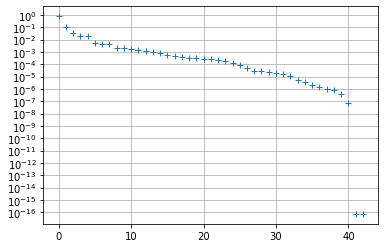

In [21]:
plt.plot(kS_tilde/kS_tilde.sum(),'+')

plt.yscale('symlog', linthresh=1.e-29)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,210)
plt.grid()

In [22]:
r_tilde=np.min([len(X_prima.columns),len(X_prima.index)])#205#33#25#41#65#11#43#33
corRed_tilde = ['$P_{{{}}}$'.format(i) for i in range(r_tilde)]

Step 2
-------
$$ G_{nx(n+q)} = X'\Omega^\dagger = X' \tilde V \tilde \Sigma^{-1}\tilde U^*$$

$$ [{A}_{nxn},B_{nxq}] = [ X' \tilde V \tilde \Sigma^{-1}\tilde U^*_1, X' \tilde V \tilde \Sigma^{-1}\tilde U^*_2]$$

In [23]:
U_tilde

,$P_{0}$,$P_{1}$,$P_{2}$,$P_{3}$,$P_{4}$,$P_{5}$,$P_{6}$,$P_{7}$,$P_{8}$,$P_{9}$,...,$P_{33}$,$P_{34}$,$P_{35}$,$P_{36}$,$P_{37}$,$P_{38}$,$P_{39}$,$P_{40}$,$P_{41}$,$P_{42}$
Casos,-0.092935,-0.239261,-2.004837e-01,0.258468,0.620509,0.072420,0.047769,-0.046603,-0.398785,0.118051,...,-0.001485,-0.001841,-1.329260e-03,-0.000456,-2.562242e-05,-0.000079,-9.440077e-05,-2.319350e-05,-1.174637e-17,-7.822358e-18
test coresp,-0.691151,-0.319540,-3.642694e-01,-0.515120,-0.141273,-0.023021,-0.004733,0.021926,-0.010306,0.007940,...,0.000011,0.000065,-5.615081e-07,-0.000013,1.243397e-05,0.000025,-1.064209e-05,3.639535e-06,1.601219e-19,-2.905557e-19
Tasa de positividad (%),-0.002732,-0.000164,-3.094476e-03,0.009418,0.021407,-0.005851,-0.007051,0.014646,-0.028827,-0.031855,...,0.002839,0.000880,-1.463540e-03,0.005260,3.155185e-03,0.007892,-1.017257e-03,5.042968e-04,3.930556e-17,-1.350599e-16
Nº de pacientes a los que se ha realizado pruebas,-0.629555,-0.017086,4.178631e-01,0.614185,-0.213286,0.039927,-0.013244,-0.056067,0.003668,-0.014928,...,-0.000019,0.000046,2.227585e-05,0.000035,-1.882414e-05,0.000006,-8.580616e-07,-5.290482e-07,8.452987e-19,-3.150882e-19
Asintomáticos,-0.046895,-0.130246,-1.222865e-01,0.115327,0.321447,-0.077203,0.106188,-0.399965,0.757329,0.145952,...,0.000775,0.000113,5.550647e-04,0.000340,2.684637e-04,0.000085,5.777651e-05,8.201010e-06,3.056909e-18,-4.551206e-18
Asintomáticos (%),-0.011054,0.022990,-3.122289e-03,-0.013393,0.002478,-0.005054,0.013478,-0.078999,0.143290,0.164236,...,0.000926,-0.001031,-5.034460e-04,-0.000565,-1.238107e-03,0.000432,-1.456355e-04,-8.793865e-05,-3.207779e-17,4.562489e-18
Zaragoza,-0.065042,-0.150961,-1.392187e-01,0.153539,0.374685,0.107027,-0.054534,0.380099,0.092747,-0.344207,...,-0.000354,0.000012,5.971785e-04,0.000117,-4.463612e-04,0.000033,-2.910680e-05,-1.719638e-05,1.044734e-17,1.811314e-18
Zaragoza (%),-0.016072,0.041978,-8.349672e-07,-0.011635,-0.033510,0.123593,0.018393,0.199027,0.129354,0.035468,...,-0.002408,-0.002772,7.491678e-04,0.000578,1.905452e-04,-0.000112,-5.347140e-04,2.792914e-05,4.490995e-18,-1.062479e-17
1 a 14 años,-0.011194,-0.022310,-3.323707e-02,0.005398,0.036329,-0.010599,-0.193721,-0.346887,-0.121837,-0.359279,...,0.001902,-0.002565,-2.139124e-04,0.000450,7.466409e-04,-0.000403,4.679846e-04,-2.138514e-05,9.578867e-18,1.586648e-17
15 a 24 años,-0.014244,-0.034565,-1.615220e-01,0.199889,0.039782,-0.732767,0.021611,0.388854,-0.047444,0.198363,...,0.001825,0.001319,9.606153e-04,0.000339,-3.258552e-05,-0.000050,3.420662e-04,8.163897e-06,-5.362169e-18,1.457597e-17


In [24]:
%%time
U_tilde_r = U_tilde.loc[:,corRed_tilde]
Sigma_tilde_r = Sigma_tilde.loc[corRed_tilde,corRed_tilde]

Sigma_tilde_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_tilde)),
                              1./kS_tilde
                             ),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

Sigma_tilde_inv_r = Sigma_tilde_inv.loc[corRed_tilde,corRed_tilde]
V_tilde = V_tilde_star.T
V_tilde_r = V_tilde.loc[:,corRed_tilde]

U_tilde_1 = U_tilde.loc[X_prima.index]
U_tilde_2 = U_tilde.loc[['Alarma']]
U_tilde_1_r = U_tilde_1.loc[:,corRed_tilde]
U_tilde_2_r = U_tilde_2.loc[:,corRed_tilde]

CPU times: user 2.03 ms, sys: 345 µs, total: 2.38 ms
Wall time: 2.07 ms


In [25]:
%%time
G = X_prima.dot(V_tilde_r).dot(Sigma_tilde_inv_r).dot(U_tilde_r.T)
G

CPU times: user 77.5 ms, sys: 2.23 ms, total: 79.8 ms
Wall time: 12.1 ms


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Casos,1.252536,-6.551250e-03,1.946000,0.017025,0.137802,-0.305094,-0.292910,0.179317,-1.393243,0.145214,...,-1.918497,-6.054147,-60.059623,29.092328,-29.595587,2.130656,-2.633915,1.548571,-0.503258,0.421827
test coresp,-2.103491,7.762947e-01,-5.551434,0.207430,2.494954,-3.444876,1.139497,-1.799538,-3.589803,1.002309,...,-53.118765,-30.006493,-383.354431,346.583278,-348.869864,-22.717989,20.431402,4.891158,-2.286587,-0.267340
Tasa de positividad (%),0.005374,5.817145e-04,1.008400,-0.000307,-0.004524,-0.018931,-0.009099,-0.003287,-0.015091,0.006103,...,0.055545,-0.381919,0.322013,-1.012627,1.020669,0.184754,-0.176712,0.036564,0.008042,0.014626
Nº de pacientes a los que se ha realizado pruebas,3.092741,-5.995003e-04,15.819531,0.796223,1.292297,-2.066789,-0.765651,4.544251,-6.777093,-2.756668,...,-82.589331,46.241530,-515.099126,422.085282,-424.530343,-41.311068,38.866007,9.384607,-2.445061,1.870591
Asintomáticos,0.130659,-1.383234e-02,1.031817,0.023370,0.907637,-0.049769,-0.038392,0.262203,-0.650396,0.209536,...,-2.724643,-4.778655,-24.910384,16.267053,-16.428086,2.377714,-2.538747,-0.262996,-0.161032,-0.324873
Asintomáticos (%),0.004716,9.505357e-04,0.436119,0.001727,0.006907,0.820314,0.008903,0.093203,-0.028133,0.004782,...,-1.037609,-0.140009,-0.615644,1.316787,-1.285938,0.569395,-0.538546,-0.019616,0.030849,-0.238153
Zaragoza,0.327824,-4.210308e-03,0.760250,0.013564,0.086424,0.103789,0.590957,0.271725,-0.921758,0.090734,...,3.031513,-4.493917,-27.710709,8.014982,-8.399984,4.023251,-4.408253,0.708344,-0.385002,0.164906
Zaragoza (%),-0.000580,-3.484643e-04,-0.264602,-0.000054,-0.004383,0.060576,0.000841,0.904248,0.010264,-0.001628,...,0.709040,0.009196,4.117447,-3.432424,3.453853,0.695965,-0.674536,-0.266234,0.021429,-0.092022
1 a 14 años,0.015670,-1.374506e-03,0.430926,0.004855,0.052348,-0.039684,-0.038783,0.089627,0.715187,0.004484,...,0.027090,-0.377533,-4.909322,2.526058,-2.572267,0.766818,-0.813027,0.137848,-0.046208,0.021865
15 a 24 años,0.071452,4.425953e-03,1.075687,0.000334,0.057920,-0.412261,-0.073837,0.009064,-0.319975,0.888991,...,-8.185021,-7.564727,-16.503556,9.548163,-9.295298,-1.649072,1.901937,0.885252,0.252865,-0.051593


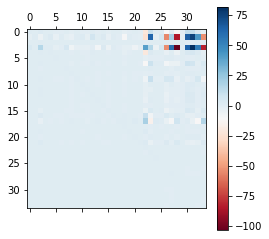

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Casos,1.252536,-6.551250e-03,1.946000,0.017025,0.137802,-0.305094,-0.292910,0.179317,-1.393243,0.145214,...,0.887652,1.311925,-10.949535,-1.942052,-11.158332,-0.400208,11.668570,11.082670,2.289702,-1.918497
test coresp,-2.103491,7.762947e-01,-5.551434,0.207430,2.494954,-3.444876,1.139497,-1.799538,-3.589803,1.002309,...,-1.933312,5.389180,-55.257520,19.853433,-85.429184,-1.834134,64.519266,75.226853,42.210567,-53.118765
Tasa de positividad (%),0.005374,5.817145e-04,1.008400,-0.000307,-0.004524,-0.018931,-0.009099,-0.003287,-0.015091,0.006103,...,0.013060,-0.021531,0.204611,-0.071347,0.133937,0.039687,-0.143840,-0.172717,-0.054681,0.055545
Nº de pacientes a los que se ha realizado pruebas,3.092741,-5.995003e-04,15.819531,0.796223,1.292297,-2.066789,-0.765651,4.544251,-6.777093,-2.756668,...,-5.523214,5.126625,-54.330927,58.590936,-103.749234,-1.400124,63.156844,81.876679,53.761660,-82.589331
Asintomáticos,0.130659,-1.383234e-02,1.031817,0.023370,0.907637,-0.049769,-0.038392,0.262203,-0.650396,0.209536,...,0.054917,0.336452,-3.258849,0.260618,-5.246296,-0.038695,4.230195,4.499081,1.942313,-2.724643
Asintomáticos (%),0.004716,9.505357e-04,0.436119,0.001727,0.006907,0.820314,0.008903,0.093203,-0.028133,0.004782,...,-0.232502,-0.113760,0.822278,0.984798,-0.140412,0.084825,-0.554759,-0.281955,0.442657,-1.037609
Zaragoza,0.327824,-4.210308e-03,0.760250,0.013564,0.086424,0.103789,0.590957,0.271725,-0.921758,0.090734,...,1.079624,1.087121,-8.596203,-4.479543,-4.847239,-0.594733,8.098480,6.497612,-1.059251,3.031513
Zaragoza (%),-0.000580,-3.484643e-04,-0.264602,-0.000054,-0.004383,0.060576,0.000841,0.904248,0.010264,-0.001628,...,0.102276,-0.029961,0.443406,-0.879227,0.772596,0.093453,-0.345450,-0.534763,-0.280202,0.709040
1 a 14 años,0.015670,-1.374506e-03,0.430926,0.004855,0.052348,-0.039684,-0.038783,0.089627,0.715187,0.004484,...,0.084660,0.142213,-0.994178,-0.646829,-0.983708,0.033284,1.160641,1.072565,0.234603,0.027090
15 a 24 años,0.071452,4.425953e-03,1.075687,0.000334,0.057920,-0.412261,-0.073837,0.009064,-0.319975,0.888991,...,-0.810021,-0.910287,5.730096,4.543819,-3.049965,1.165603,-2.657648,-0.763321,5.086310,-8.185021


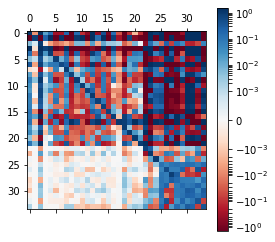

In [26]:
A = G.loc[:,celdas]
B = G.loc[:,entradas]
#D = G.loc[:,salidas]
#A_tilde[:11,:11].round(0).astype(int)

#import matplotlib.pyplot as plt
import matplotlib.colors as colors

plt.matshow(A, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()
A

(34, 381) = (34, 34)·(34, 34)·(34, 381)
CPU times: user 48.9 ms, sys: 28.8 ms, total: 77.7 ms
Wall time: 12.6 ms


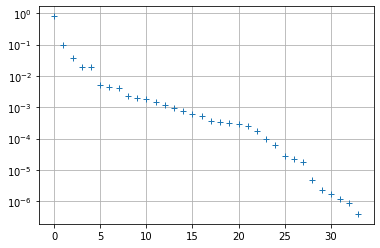

In [27]:
%%time
U_hat,kS_hat,V_hat_star = np.linalg.svd(X_prima,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_hat = pd.DataFrame(np.diag(kS_hat),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

V_hat_star = pd.DataFrame(V_hat_star,
                            columns=X_prima.columns,
                            index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                           )

U_hat = pd.DataFrame(U_hat,index=X_prima.index,
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],)

V_hat = V_hat_star.T


print("{} = {}·{}·{}".format(X_prima.shape,U_hat.shape,Sigma_hat.shape,V_hat_star.shape))
#plt.plot(Sigma/np.sum(Sigma),'+')
plt.plot(kS_hat/kS_hat.sum(),'+')

plt.yscale('symlog', linthresh=1.e-22)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,200)
plt.grid()

In [28]:
#GOTO0
thresh = 1e-6#6
#np.where(kS_hat/kS_hat.sum()<thresh)[0][0]
try:
    print(np.where(kS_hat/kS_hat.sum()<thresh)[0][0])#7#33#25#41#65#11#43#33  )
except:
    print(len(kS_hat))

32


In [29]:
r=len(kS_hat)
try:
    r = np.where(kS_hat/kS_hat.sum()<thresh)[0][0]#7#33#25#41#65#11#43#33  
except:
    r=len(kS_hat)
corRed = ['$\tilde x^{{{}}}$'.format(i) for i in range(r)]
U_hat.loc[:,corRed]

,$\tilde x^{0}$,$\tilde x^{1}$,$\tilde x^{2}$,$\tilde x^{3}$,$\tilde x^{4}$,$\tilde x^{5}$,$\tilde x^{6}$,$\tilde x^{7}$,$\tilde x^{8}$,$\tilde x^{9}$,...,$\tilde x^{22}$,$\tilde x^{23}$,$\tilde x^{24}$,$\tilde x^{25}$,$\tilde x^{26}$,$\tilde x^{27}$,$\tilde x^{28}$,$\tilde x^{29}$,$\tilde x^{30}$,$\tilde x^{31}$
Casos,-0.092900,-0.239490,-0.198179,0.381021,0.554384,0.072081,-0.049478,0.045378,-0.400684,0.113598,...,0.127396,0.047142,0.009337,0.008012,0.009852,0.005373,0.003496,0.001086,0.000363,0.000250
test coresp,-0.691166,-0.318426,-0.368597,-0.530784,-0.032309,-0.024768,0.004225,-0.023146,-0.010294,0.011398,...,-0.000069,0.004702,0.001035,-0.000843,-0.000002,0.000156,0.000007,0.000028,0.000025,-0.000015
Tasa de positividad (%),-0.002730,-0.000188,-0.002969,0.013713,0.019017,-0.005962,0.007212,-0.014682,-0.028968,-0.032576,...,-0.021853,0.937418,0.126691,-0.195645,-0.013600,0.039063,0.015506,0.005226,-0.005235,-0.004778
Nº de pacientes a los que se ha realizado pruebas,-0.629549,-0.018125,0.421623,0.553824,-0.335121,0.041906,0.013924,0.058550,0.001261,-0.010329,...,0.001355,-0.000237,-0.000430,0.000073,0.000059,-0.000102,-0.000075,-0.000005,-0.000025,0.000001
Asintomáticos,-0.046867,-0.130382,-0.121232,0.180454,0.290055,-0.074322,-0.112676,0.399395,0.760049,0.133964,...,0.013228,0.024428,-0.000174,-0.007730,-0.001719,0.000612,-0.000033,-0.000327,-0.000292,-0.000371
Asintomáticos (%),-0.011054,0.023007,-0.003248,-0.012484,0.004894,-0.003825,-0.014322,0.079727,0.143808,0.149343,...,-0.142410,-0.027826,0.012675,0.020139,0.021042,-0.003517,-0.000830,0.000093,0.000593,0.001170
Zaragoza,-0.065011,-0.151189,-0.137486,0.229165,0.335092,0.107344,0.063315,-0.380099,0.102253,-0.359005,...,-0.002005,-0.066504,0.011503,-0.000628,-0.014902,-0.000855,-0.000442,-0.000834,-0.000142,0.000138
Zaragoza (%),-0.016074,0.041969,0.000069,-0.017742,-0.030449,0.125437,-0.012755,-0.200169,0.143690,-0.025024,...,0.073950,0.163741,-0.018419,-0.004005,0.027968,-0.001965,0.006274,-0.000771,-0.000382,0.000189
1 a 14 años,-0.011194,-0.022293,-0.033028,0.012898,0.034916,-0.014159,0.186240,0.347720,-0.109952,-0.435344,...,-0.205649,-0.094962,-0.043324,0.007269,0.007022,-0.004460,0.002364,0.000250,-0.001014,-0.000478
15 a 24 años,-0.014240,-0.034578,-0.159933,0.207873,-0.004020,-0.730943,-0.022456,-0.389829,-0.047669,0.205877,...,-0.134583,-0.056537,-0.025945,-0.013795,0.006478,-0.014695,-0.002938,-0.000778,-0.000287,0.000091


In [30]:
U_hat_r = U_hat.loc[:,corRed]
Sigma_hat_r = Sigma_hat.loc[corRed,corRed]

Sigma_hat_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_hat)),
                              1./kS_hat
                             ),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

Sigma_hat_inv_r = Sigma_hat_inv.loc[corRed,corRed]
V_hat =   V_hat_star.T
V_hat_r = V_hat.loc[:,corRed]

$$ \tilde A \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_1^* \hat U_r$$
$$ \tilde B \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_2^* $$

$$\tilde x_{k+1} = \tilde A\tilde x_k + \tilde B u_k $$
$$ Con: x  \tilde = \hat U_r \tilde x; \tilde x = \hat U_r^* x$$

$$ x_{k+1} = A_{nxn}x_k+B_{nx1}u_k $$

$$\tilde x_{k+1} = \tilde A_{rxr}\tilde x_k + \tilde B_{rx1} u_k $$

$$ x_{k+1} \tilde = \hat U_{nxr} \tilde x_{k+1} $$

In [31]:
A_tilde = U_hat_r.T.dot(A).dot(U_hat_r.loc[celdas])
B_tilde = U_hat_r.T.dot(B)

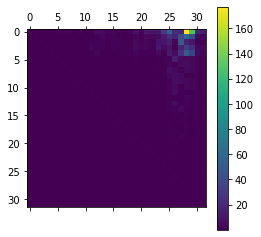

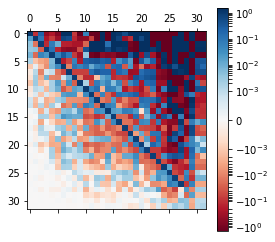

In [32]:
plt.matshow(np.absolute(A_tilde))#, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A_tilde, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()

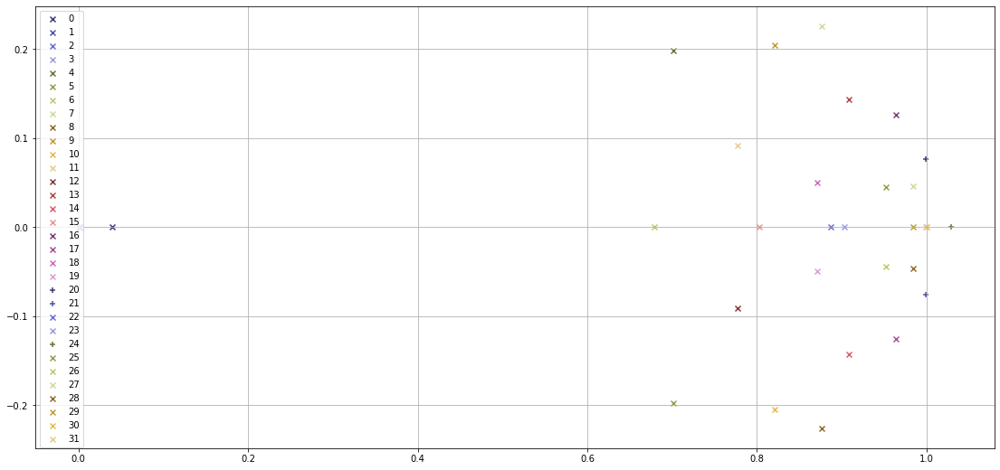

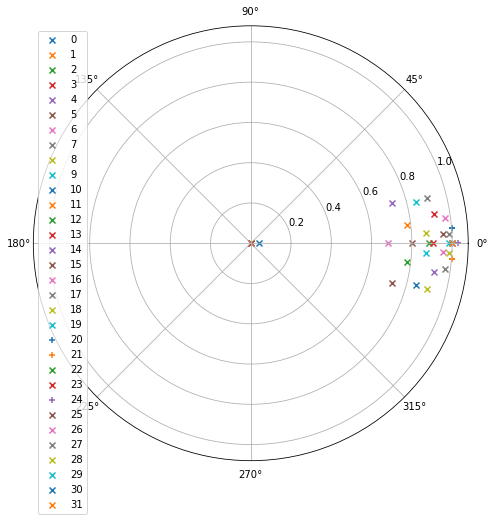

In [33]:
Lambda,W = np.linalg.eig(A_tilde)
colores = plt.cm.tab20b.colors
colores = colores + colores

fig = plt.figure(figsize=(19,9))
for i in range(len(Lambda)):
    if np.abs(Lambda[i]) >= 1:
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='+')
    else:    
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='x')
plt.legend(loc=2)
plt.grid()
plt.show()

#fig, ax = plt.subplots(figsize=(9, 9))
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='polar')
j = 0
for i in Lambda:
    if np.abs(i) > 1:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='+',label=j)
    else:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='x',label=j)
    j+=1
plt.legend(loc=2)
plt.show()

In [34]:
X_interp = A.dot(Omega.loc[celdas])
puntos_int = X_interp.T.shift(1)
display(puntos.shift(-1).tail())
display(puntos_int.tail())

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-22,4.0,84.714286,1986.714286,1671.285714,4.370000,48.964286,59.000000,17.142857,6.000000,9.428571,...,42.057203,87.805681,89.024063,81.281236,86.203752,89.115309,88.655185,89.246586,91.215478,89.025906
2021-09-23,4.0,83.714286,2069.142857,1617.142857,4.184286,48.342857,57.714286,16.428571,5.285714,9.857143,...,41.899648,87.799336,89.015160,81.276969,86.196796,89.110466,88.650681,89.242304,91.211885,89.014319
2021-09-24,4.0,82.428571,2047.000000,1605.285714,4.155714,46.741429,58.285714,16.571429,5.428571,9.571429,...,41.742094,87.793088,89.006181,81.272586,86.190042,89.105765,88.645900,89.238264,91.208397,89.002827
2021-09-25,4.0,81.000000,2080.714286,1565.428571,3.867143,45.751429,58.571429,17.428571,4.857143,9.714286,...,41.584548,87.786948,88.996736,81.268665,86.183187,89.101278,88.641327,89.233982,91.204698,88.991905
2021-09-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-22,94.617225,2065.700992,4.090751,1824.651913,59.453752,56.537716,57.163024,64.378362,16.475597,18.406463,...,42.555985,87.808493,88.964947,81.292982,86.185579,89.107448,88.689256,89.275445,91.205721,89.011916
2021-09-23,97.282619,2123.012195,4.178447,1813.776865,61.322187,57.993562,62.131093,66.576616,17.788872,18.698583,...,42.358619,87.799254,88.960357,81.285247,86.177705,89.098223,88.676387,89.267392,91.201664,89.012666
2021-09-24,89.480629,2121.660951,3.920015,1780.972672,58.186094,58.820142,56.568970,67.057729,14.922494,17.536927,...,42.176275,87.792886,88.953851,81.280640,86.170792,89.092586,88.668811,89.264405,91.199375,89.002468
2021-09-25,85.317170,2147.721058,3.807648,1743.446184,54.661230,58.978145,54.023784,67.127328,15.449741,17.263091,...,42.006348,87.786673,88.948682,81.275786,86.163051,89.085467,88.659354,89.258187,91.197734,89.003021
2021-09-26,84.399537,2214.410103,3.684746,1717.679013,51.256817,58.579334,52.982948,66.606549,14.711722,17.247910,...,41.847611,87.779209,88.937117,81.272494,86.156017,89.083316,88.654298,89.252677,91.196900,88.992925


In [35]:
#for i in variables:
#    fig, ax = plt.subplots(figsize=(15,6))
#    #Omega.T[[i]].plot(ax=ax,label='{} interpolado'.format(i))
#    X_prima.T[[i]].plot(ls='-',ax=ax,label='{} interpolado'.format(i))
#    X_interp.T[[i]].plot(ls='--',ax=ax,label='{} interpolado'.format(i))
#    plt.grid()
#    plt.legend()
#    plt.show()

In [36]:
(X_interp-X_prima).divide(X_prima/100.).T.describe()

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
count,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,...,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000
mean,7.701225,7.235582,-1.493595,5.534527,13.461455,3.598919,4.654906,-1.426944,4.888457,42.848747,...,0.159003,-0.010615,-0.066082,-0.001194,-0.013666,-0.019396,0.041141,0.018005,-0.031576,-0.035231
std,6.621985,3.659884,4.258288,4.384272,11.745741,3.785683,5.960908,1.828115,7.148624,36.198084,...,0.206011,0.008320,0.025797,0.018669,0.019276,0.016456,0.040472,0.024909,0.015683,0.050375
min,-6.489649,-5.255884,-19.119427,-7.517145,-9.055858,-5.188233,-11.815751,-8.779234,-13.288574,-7.778564,...,-0.057754,-0.029982,-0.126277,-0.038562,-0.060218,-0.053003,-0.032850,-0.035240,-0.068317,-0.128371
25%,2.907803,4.872876,-4.113663,2.963620,5.016435,1.111054,0.794478,-2.305580,0.613408,16.395050,...,-0.002915,-0.014186,-0.085521,-0.013141,-0.022978,-0.029884,0.009151,-0.003162,-0.042830,-0.082208
50%,6.635094,6.788692,-1.274642,4.982437,11.464497,3.364595,4.276416,-1.353413,4.184622,35.199601,...,0.056536,-0.010574,-0.065774,0.002383,-0.011597,-0.022785,0.028922,0.019878,-0.033189,-0.028450
75%,11.510397,9.003416,1.402775,8.001842,18.896128,5.973323,8.283188,-0.526189,8.843462,62.813452,...,0.322597,-0.007030,-0.046245,0.010487,-0.001739,-0.007007,0.081117,0.039829,-0.021269,0.002353
max,30.137171,23.540915,12.173330,24.277627,57.179641,20.022089,23.886387,8.695554,32.130309,254.308817,...,0.731950,0.112567,0.026990,0.110129,0.127587,0.082181,0.162536,0.114430,0.058411,0.186514


In [37]:
x1 = puntos[variables].T.iloc[:,-12]
display(x1)
display(puntos[variables].T.iloc[:,-11])
A.dot(x1)

Casos                                                  96.571429
test coresp                                          1740.571429
Tasa de positividad (%)                                 5.402857
Nº de pacientes a los que se ha realizado pruebas    1641.285714
Asintomáticos                                          46.188571
Asintomáticos (%)                                      47.714286
Zaragoza                                               68.857143
Zaragoza (%)                                           72.798303
1 a 14 años                                            23.285714
15 a 24 años                                            9.142857
25 a 34 años                                            8.571429
35 a 44 años                                           17.714286
45 a 54 años                                           13.285714
55 a 64 años                                            8.000000
65 a 74 años                                            5.000000
75 años o más            

Casos                                                  89.285714
test coresp                                          1763.857143
Tasa de positividad (%)                                 4.921429
Nº de pacientes a los que se ha realizado pruebas    1663.142857
Asintomáticos                                          42.477143
Asintomáticos (%)                                      48.142857
Zaragoza                                               63.142857
Zaragoza (%)                                           72.337552
1 a 14 años                                            21.714286
15 a 24 años                                            8.571429
25 a 34 años                                            7.428571
35 a 44 años                                           16.142857
45 a 54 años                                           12.285714
55 a 64 años                                            8.000000
65 a 74 años                                            4.714286
75 años o más            

Casos                                                 105.813573
test coresp                                          1976.201707
Tasa de positividad (%)                                 4.684051
Nº de pacientes a los que se ha realizado pruebas    1816.695954
Asintomáticos                                          58.395378
Asintomáticos (%)                                      50.778108
Zaragoza                                               68.814284
Zaragoza (%)                                           71.651868
1 a 14 años                                            23.562325
15 a 24 años                                           18.928373
25 a 34 años                                           10.706189
35 a 44 años                                           16.098730
45 a 54 años                                           11.625108
55 a 64 años                                            6.527947
65 a 74 años                                            4.683907
75 años o más            

,Alarma,Festivo,Reuniones,VacunasD,Vacunas,Casos,Lectivo
2021-09-12,1.0,0.0,0.0,0.000,11.016,31.0,0.0
2021-09-13,1.0,0.0,0.0,0.926,4.264,121.0,0.0
2021-09-14,1.0,0.0,0.0,3.094,7.745,83.0,0.0
2021-09-15,1.0,0.0,0.0,8.176,13.822,128.0,0.0
2021-09-16,1.0,0.0,0.0,0.037,12.277,86.0,0.0
2021-09-17,1.0,0.0,7.0,7.677,7.676,92.0,0.0
2021-09-18,1.0,0.0,7.0,0.000,0.000,61.0,0.0
2021-09-19,1.0,0.0,0.0,0.001,0.005,51.0,0.0
2021-09-20,1.0,0.0,0.0,1.325,2.440,89.0,0.0
2021-09-21,1.0,0.0,0.0,5.713,7.122,130.0,0.0


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-09-18,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,8.114286
2021-09-19,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,6.541286
2021-09-20,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,6.280714
2021-09-21,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,6.191714
2021-09-22,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.848286
2021-09-23,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.448143
2021-09-24,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.092571
2021-09-25,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.092571
2021-09-26,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.092286
2021-09-27,0.857143,0.0,0.285714,0.714286,0.857143,0.142857,2.0,1.0,4.950571


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-09-18,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,8.114286
2021-09-19,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,6.541286
2021-09-20,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,6.280714
2021-09-21,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,6.191714
2021-09-22,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.848286
2021-09-23,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.448143
2021-09-24,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.092571
2021-09-25,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.092571
2021-09-26,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.092286
2021-09-27,0.857143,0.0,0.285714,0.714286,0.857143,0.142857,2.0,1.0,4.950571


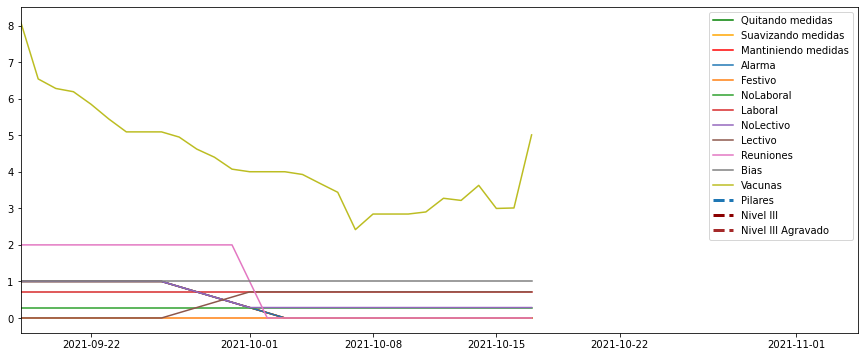

In [38]:
#x1 = puntos.loc[pd.date_range('2020-9-07',periods=83,freq='d')].copy()
x1 = puntos.loc['2020-10-21':].copy() #goto0
#x1 = puntos.loc['2020-10-7':].copy() #goto0
##x1 = puntos.loc['2020-10-1':].copy() #goto0
##x1 = puntos.loc['2020-11-1':].copy()
diasCalc = 21
x1 = puntos.iloc[-15:].copy()
#x1 = puntos.iloc[-29:].copy()
#x1 = puntos.iloc[-8:].copy()
#x1 = puntos.iloc[-1:].copy()


#x1 = puntos.loc['2021-7-1':].copy() 
U1 = x1[entradas]
U1 = total.loc[x1.index,['Alarma']]
U0 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
                                                   
U2 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
x1_0 = x1.iloc[7].copy()
U1 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
##U0.loc['2021-9-26':,'Alarma'] = 1
##U1.loc['2021-9-26':,'Alarma'] = 1
##U2.loc['2021-9-26':,'Alarma'] = 1
###
###U0.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U1.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U2.loc['2020-12-5':'2020-12-9','Alarma'] = 0
U0.Alarma.fillna(method="ffill",inplace=True)
U1.Alarma.fillna(method="ffill",inplace=True)
U2.Alarma.fillna(method="ffill",inplace=True)
#U0.Alarma.fillna(0,inplace=True)
#U1.Alarma.fillna(0,inplace=True)
#U2.Alarma.fillna(0,inplace=True)


#U1.Alarma = total.Alarma
#U0.Alarma = total.Alarma
#U2.Alarma = total.Alarma

#U1 = Al1.copy()
U1['Festivo'] = total['Festivo']
U0['Festivo'] = total['Festivo']
U2['Festivo'] = total['Festivo']

U1['Reuniones'] = total['Reuniones']
U0['Reuniones'] = total['Reuniones']
U2['Reuniones'] = total['Reuniones']

U1['VacunasD'] = total['VacunasD']
U0['VacunasD'] = total['VacunasD']
U2['VacunasD'] = total['VacunasD']


U1['Vacunas'] = total['Vacunas']
U0['Vacunas'] = total['Vacunas']
U2['Vacunas'] = total['Vacunas']

U1['Casos'] = total['Casos']
U0['Casos'] = total['Casos']
U2['Casos'] = total['Casos']




U1['Lectivo']   = total['Lectivo']

display(U1)

U1.Festivo.fillna(0,inplace=True)
#U1.loc['2021-04-23':'2021-04-24','Festivo']=1
U0['Festivo'] = U1.Festivo
U2['Festivo'] = U1.Festivo

U1.Reuniones.fillna(0,inplace=True)
U1.loc['2021-09-17':'2021-09-18','Reuniones']=7
U1.loc['2021-09-24':'2021-09-25','Reuniones']=7
U0['Reuniones'] = U1.Reuniones
U2['Reuniones'] = U1.Reuniones

for i in U0.index:
    if i in vacunasD.index:
        #display(i)
        U0.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U1.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U2.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
U0.VacunasD.fillna(1,inplace=True)
#U0.Vacunas = 0
U1.VacunasD.fillna(2,inplace=True)
U2.VacunasD.fillna(3,inplace=True)
for i in U0.index:
    if i in vacunas.index:
        #display(i)
        U0.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U1.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U2.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
U0.Vacunas.fillna(12,inplace=True)
#U0.Vacunas = 0
U1.Vacunas.fillna(14,inplace=True)
U2.Vacunas.fillna(16,inplace=True)
U0.Casos.fillna(100,inplace=True)
U1.Casos.fillna(100,inplace=True)
U2.Casos.fillna(100,inplace=True)


U0.loc[:,'Inoculados'] = U0.Vacunas.cumsum()/2# + U0.Casos.cumsum()
U1.loc[:,'Inoculados'] = U1.Vacunas.cumsum()/2# + U1.Casos.cumsum()
U2.loc[:,'Inoculados'] = U2.Vacunas.cumsum()/2# + U2.Casos.cumsum()

U1.loc[:,'Laboral'] = 1 #- total.Festivo/7
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Laboral' ] =0
U0['Laboral'] = U1.Laboral
U2['Laboral'] = U1.Laboral

U1.Lectivo.fillna(1,inplace=True)#llegan las vacaciones
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Lectivo' ] =0
U1.loc['2021-06-21':'2021-09-08','Lectivo']=0 #vacaciones
U0['Lectivo'] = U1.Lectivo
U2['Lectivo'] = U1.Lectivo

U1.loc[:,'NoLectivo'] = 1-U1.Lectivo
U0.loc[:,'NoLectivo'] = U1.NoLectivo
U2.loc[:,'NoLectivo'] = U1.NoLectivo

U1.loc[:,'NoLaboral'] = 1-U1.Laboral
U0.loc[:,'NoLaboral'] = U1.NoLaboral
U2.loc[:,'NoLaboral'] = U1.NoLaboral

U0['Bias'] = 1
U1['Bias'] = 1
U2['Bias'] = 1


U0 = U0.rolling(7,center=False).mean().copy().dropna()
U1 = U1.rolling(7,center=False).mean().copy().dropna()
U2 = U2.rolling(7,center=False).mean().copy().dropna()

fig, ax = plt.subplots(figsize=(15,6))
#highlight_datetimes(pd.concat([diario.loc['2020-9-7':],U1]).index.unique(), ax,items=False)

plt.plot(U0.index,U0.Alarma,axes=ax,c='green',label='Quitando medidas')
plt.plot(U1.index,U1.Alarma,axes=ax,c='orange',label='Suavizando medidas')
plt.plot(U2.index,U2.Alarma,axes=ax,c='r',label='Mantiniendo medidas')
for i in entradas:
    plt.plot(U1.index,U1[i],axes=ax,label=i)
    
ax.axvline(pd.Timestamp('2020-10-12'),lw=3,ls='--',label='Pilares')
ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
plt.legend()
plt.xlim(left=U0.index[0])

display(U2[entradas],U1[entradas])

In [39]:
import control as ct

#C = np.identity(len(A_tilde.columns))
C = U_hat_r.loc[celdas]
D = np.zeros((len(A_tilde.columns),len(B_tilde.columns)))

In [40]:
fsys_A_tilde = ct.ss(A_tilde,B_tilde,C,np.zeros((len(C.index),len(B_tilde.columns))),1)

In [41]:
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),x1[entradas].T.values
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0,0,1]))

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]])

In [42]:
%time
Ukk = U1.copy()
Ukk.Alarma=0
Ukk.Vacunas = 0
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=np.arange(len(Ukk.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(U1.index)),[0,0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=Ukk[entradas].T.values, 
                         #U=x1[[entradas]].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]).values)
noAction = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(noAction.T)

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 1.91 µs


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-18,88.857143,1817.285714,4.892833,1826.571429,48.158571,54.571426,60.428570,66.783742,18.857145,8.285714,...,42.792549,87.833437,89.060801,81.301741,86.228529,89.140157,88.673010,89.266781,91.225377,89.068285
2021-09-19,93.183853,1905.325759,4.962017,1694.205501,58.012568,56.322481,65.257936,67.982362,19.046266,16.009818,...,42.729376,87.825016,89.043910,81.289659,86.237880,89.145269,88.702491,89.266083,91.212124,89.024269
2021-09-20,94.496232,1952.188676,5.046899,1606.676157,62.662708,57.719986,68.004070,69.067422,18.243441,24.666718,...,42.663567,87.820059,89.039607,81.269176,86.235096,89.141120,88.694306,89.260826,91.209808,89.033594
2021-09-21,94.553926,1972.413546,5.137869,1552.345277,64.611038,58.867408,70.232278,70.109729,16.937552,33.581334,...,42.595421,87.816205,89.037244,81.241535,86.235517,89.138969,88.689371,89.257917,91.207368,89.045100
2021-09-22,94.361009,1978.127138,5.216507,1523.717498,65.561845,59.865921,72.584294,71.106472,15.459093,42.228152,...,42.526216,87.813346,89.036214,81.207252,86.237095,89.138184,88.687221,89.257585,91.205457,89.058280
2021-09-23,94.232050,1976.965754,5.267862,1512.696314,66.492314,60.787502,75.142095,72.046304,14.018002,50.146346,...,42.456673,87.811233,89.036149,81.166864,86.238849,89.138337,88.687402,89.259487,91.204321,89.072845
2021-09-24,94.034502,1972.888418,5.281451,1511.621052,67.818045,61.674701,77.657483,72.917721,12.731801,56.964753,...,42.387131,87.809660,89.036712,81.121233,86.240058,89.139166,88.689572,89.263273,91.204143,89.088548
2021-09-25,93.392706,1967.162554,5.251221,1513.950097,69.566334,62.545883,79.725825,73.712377,11.650222,62.414803,...,42.317684,87.808497,89.037617,81.071462,86.240247,89.140527,88.693492,89.268653,91.205062,89.105219
2021-09-26,91.840140,1959.278297,5.175067,1514.526972,71.529731,63.402206,80.908784,74.426300,10.775767,66.330699,...,42.248294,87.807698,89.038647,81.018791,86.239166,89.142360,88.698994,89.275412,91.207184,89.122768
2021-09-27,88.922837,1947.715081,5.054107,1509.579968,73.387881,64.234370,80.812729,75.059805,10.080104,68.640921,...,42.178873,87.807296,89.039656,80.964517,86.236764,89.144657,88.705973,89.283408,91.210587,89.141164


In [43]:
%%time 
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U1[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


kControl = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(kControl.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U0[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


rellaxed = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(rellaxed.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U2[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


hard = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(hard.T)

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-18,88.857143,1817.285714,4.892833,1826.571429,48.158571,54.571426,60.428570,66.783742,18.857145,8.285714,...,42.792549,87.833437,89.060801,81.301741,86.228529,89.140157,88.673010,89.266781,91.225377,89.068285
2021-09-19,90.552530,1873.149995,4.698799,1755.625541,50.597800,54.250032,62.102110,67.244868,18.846153,8.026452,...,42.559869,87.823085,89.052693,81.293726,86.209169,89.127425,88.657979,89.255493,91.222417,89.067524
2021-09-20,88.086037,1903.452499,4.521024,1689.573059,49.833171,54.224849,60.795436,67.756735,18.164092,8.205644,...,42.361197,87.814291,89.037138,81.288272,86.199669,89.121738,88.657576,89.252021,91.220419,89.046802
2021-09-21,83.292374,1913.487617,4.364368,1638.290015,46.498387,54.161294,57.734834,68.187044,17.091301,8.559724,...,42.166939,87.806345,89.027095,81.281097,86.190373,89.115291,88.650795,89.246153,91.218080,89.037683
2021-09-22,77.092461,1907.366630,4.231796,1599.766053,41.554075,54.049290,53.681870,68.548924,15.823608,8.891475,...,41.973485,87.799101,89.018799,81.273270,86.182547,89.109776,88.643947,89.240530,91.215492,89.030656
2021-09-23,70.027784,1889.491094,4.116752,1571.466061,35.926602,53.990280,49.054894,68.874315,14.494934,9.093042,...,41.787410,87.792806,89.010754,81.265673,86.176426,89.105976,88.639730,89.236594,91.212991,89.022318
2021-09-24,62.519469,1863.609260,4.011975,1551.473152,30.254588,54.023741,44.118368,69.168100,13.203517,9.054832,...,41.610542,87.787498,89.003556,81.258263,86.171619,89.103282,88.636887,89.233843,91.210691,89.014587
2021-09-25,54.840533,1832.527660,3.911602,1537.474136,24.934743,54.152600,39.023855,69.428726,12.014336,8.677117,...,41.442126,87.783095,88.997433,81.251115,86.167848,89.101233,88.634641,89.231868,91.208649,89.008414
2021-09-26,47.259444,1798.240934,3.815029,1527.626021,20.085912,54.296919,33.885322,69.628682,10.968609,7.878772,...,41.273884,87.779269,88.993168,81.243954,86.164234,89.098708,88.630637,89.229507,91.206851,89.006272
2021-09-27,39.810463,1762.202920,3.720085,1519.096311,15.813288,54.463011,28.712782,69.779233,10.072863,6.665084,...,41.105812,87.775960,88.989386,81.237607,86.161023,89.096338,88.626973,89.227597,91.205414,89.004931


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-18,88.857143,1817.285714,4.892833,1826.571429,48.158571,54.571426,60.428570,66.783742,18.857145,8.285714,...,42.792549,87.833437,89.060801,81.301741,86.228529,89.140157,88.673010,89.266781,91.225377,89.068285
2021-09-19,90.552530,1873.149995,4.698799,1755.625541,50.597800,54.250032,62.102110,67.244868,18.846153,8.026452,...,42.559869,87.823085,89.052693,81.293726,86.209169,89.127425,88.657979,89.255493,91.222417,89.067524
2021-09-20,88.086037,1903.452499,4.521024,1689.573059,49.833171,54.224849,60.795436,67.756735,18.164092,8.205644,...,42.361197,87.814291,89.037138,81.288272,86.199669,89.121738,88.657576,89.252021,91.220419,89.046802
2021-09-21,83.292374,1913.487617,4.364368,1638.290015,46.498387,54.161294,57.734834,68.187044,17.091301,8.559724,...,42.166939,87.806345,89.027095,81.281097,86.190373,89.115291,88.650795,89.246153,91.218080,89.037683
2021-09-22,77.092461,1907.366630,4.231796,1599.766053,41.554075,54.049290,53.681870,68.548924,15.823608,8.891475,...,41.973485,87.799101,89.018799,81.273270,86.182547,89.109776,88.643947,89.240530,91.215492,89.030656
2021-09-23,70.027784,1889.491094,4.116752,1571.466061,35.926602,53.990280,49.054894,68.874315,14.494934,9.093042,...,41.787410,87.792806,89.010754,81.265673,86.176426,89.105976,88.639730,89.236594,91.212991,89.022318
2021-09-24,62.519469,1863.609260,4.011975,1551.473152,30.254588,54.023741,44.118368,69.168100,13.203517,9.054832,...,41.610542,87.787498,89.003556,81.258263,86.171619,89.103282,88.636887,89.233843,91.210691,89.014587
2021-09-25,54.840533,1832.527660,3.911602,1537.474136,24.934743,54.152600,39.023855,69.428726,12.014336,8.677117,...,41.442126,87.783095,88.997433,81.251115,86.167848,89.101233,88.634641,89.231868,91.208649,89.008414
2021-09-26,47.259444,1798.240934,3.815029,1527.626021,20.085912,54.296919,33.885322,69.628682,10.968609,7.878772,...,41.273884,87.779269,88.993168,81.243954,86.164234,89.098708,88.630637,89.229507,91.206851,89.006272
2021-09-27,39.810463,1762.202920,3.720085,1519.096311,15.813288,54.463011,28.712782,69.779233,10.072863,6.665084,...,41.105812,87.775960,88.989386,81.237607,86.161023,89.096338,88.626973,89.227597,91.205414,89.004931


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-18,88.857143,1817.285714,4.892833,1826.571429,48.158571,54.571426,60.428570,66.783742,18.857145,8.285714,...,42.792549,87.833437,89.060801,81.301741,86.228529,89.140157,88.673010,89.266781,91.225377,89.068285
2021-09-19,90.552530,1873.149995,4.698799,1755.625541,50.597800,54.250032,62.102110,67.244868,18.846153,8.026452,...,42.559869,87.823085,89.052693,81.293726,86.209169,89.127425,88.657979,89.255493,91.222417,89.067524
2021-09-20,88.086037,1903.452499,4.521024,1689.573059,49.833171,54.224849,60.795436,67.756735,18.164092,8.205644,...,42.361197,87.814291,89.037138,81.288272,86.199669,89.121738,88.657576,89.252021,91.220419,89.046802
2021-09-21,83.292374,1913.487617,4.364368,1638.290015,46.498387,54.161294,57.734834,68.187044,17.091301,8.559724,...,42.166939,87.806345,89.027095,81.281097,86.190373,89.115291,88.650795,89.246153,91.218080,89.037683
2021-09-22,77.092461,1907.366630,4.231796,1599.766053,41.554075,54.049290,53.681870,68.548924,15.823608,8.891475,...,41.973485,87.799101,89.018799,81.273270,86.182547,89.109776,88.643947,89.240530,91.215492,89.030656
2021-09-23,70.027784,1889.491094,4.116752,1571.466061,35.926602,53.990280,49.054894,68.874315,14.494934,9.093042,...,41.787410,87.792806,89.010754,81.265673,86.176426,89.105976,88.639730,89.236594,91.212991,89.022318
2021-09-24,62.519469,1863.609260,4.011975,1551.473152,30.254588,54.023741,44.118368,69.168100,13.203517,9.054832,...,41.610542,87.787498,89.003556,81.258263,86.171619,89.103282,88.636887,89.233843,91.210691,89.014587
2021-09-25,54.840533,1832.527660,3.911602,1537.474136,24.934743,54.152600,39.023855,69.428726,12.014336,8.677117,...,41.442126,87.783095,88.997433,81.251115,86.167848,89.101233,88.634641,89.231868,91.208649,89.008414
2021-09-26,47.259444,1798.240934,3.815029,1527.626021,20.085912,54.296919,33.885322,69.628682,10.968609,7.878772,...,41.273884,87.779269,88.993168,81.243954,86.164234,89.098708,88.630637,89.229507,91.206851,89.006272
2021-09-27,39.810463,1762.202920,3.720085,1519.096311,15.813288,54.463011,28.712782,69.779233,10.072863,6.665084,...,41.105812,87.775960,88.989386,81.237607,86.161023,89.096338,88.626973,89.227597,91.205414,89.004931


CPU times: user 41 ms, sys: 3.06 ms, total: 44.1 ms
Wall time: 43.3 ms


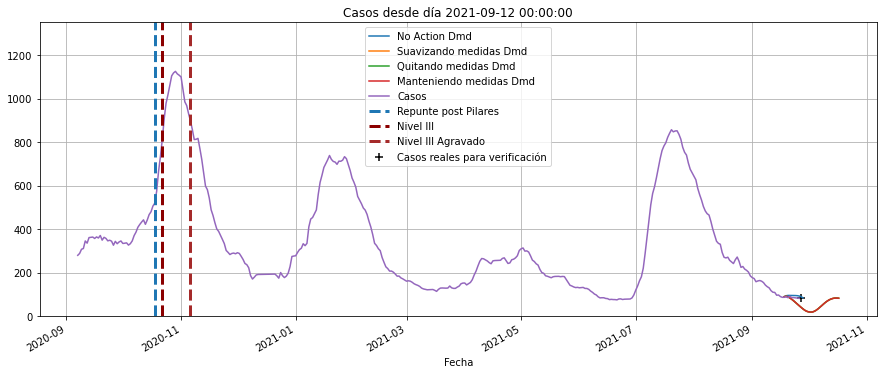

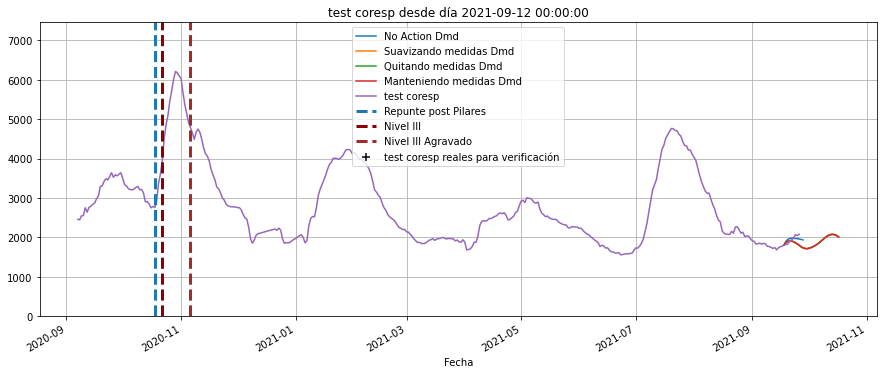

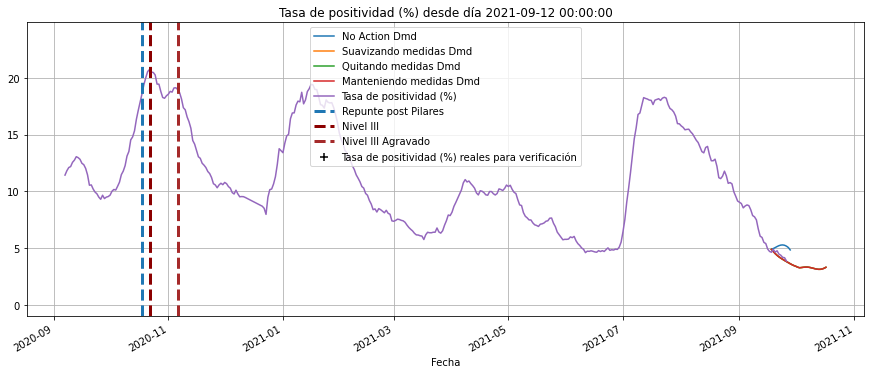

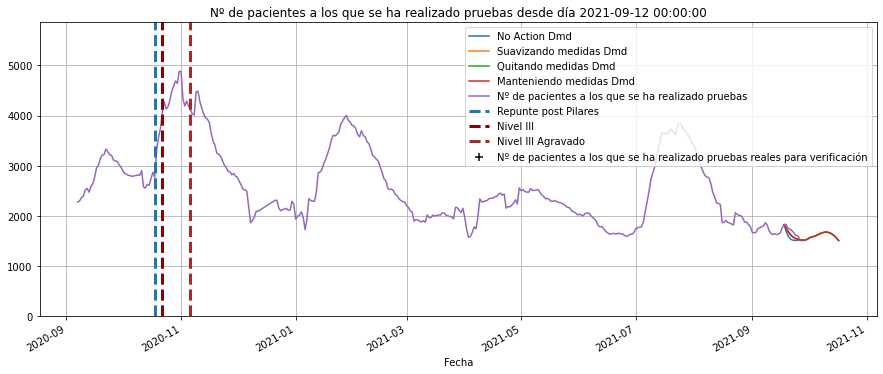

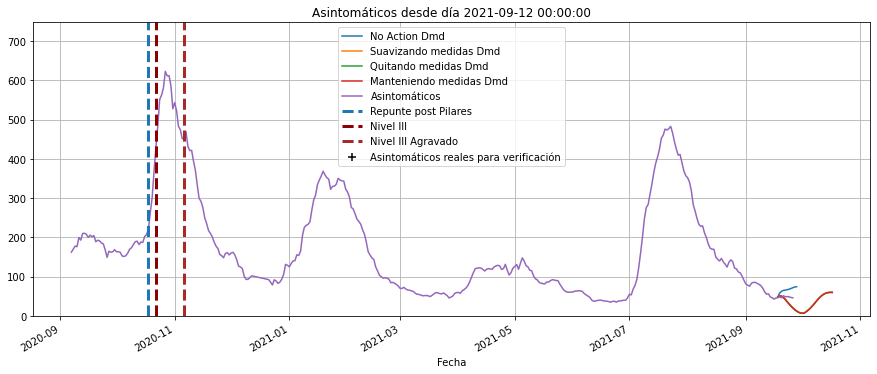

...

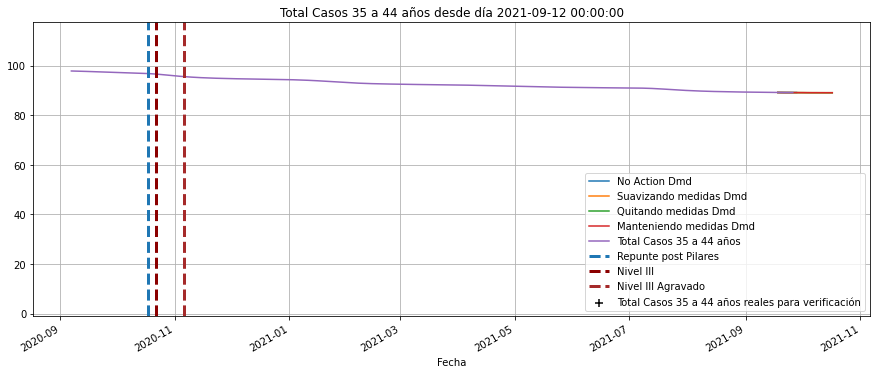

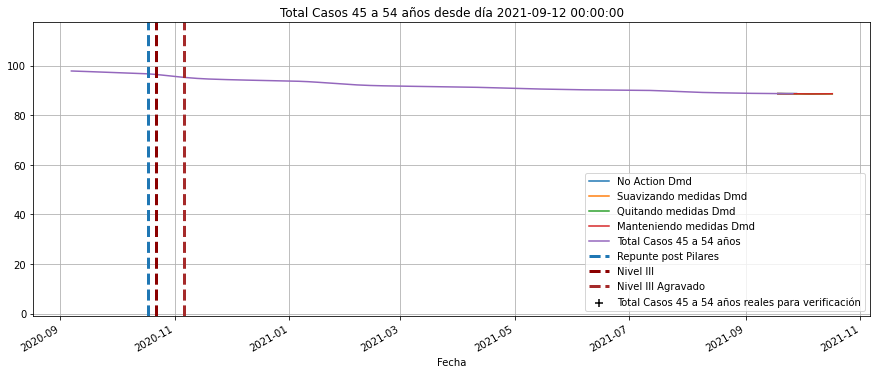

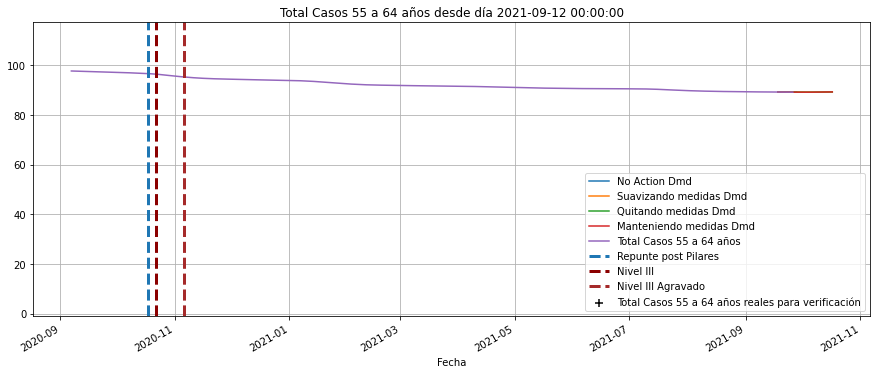

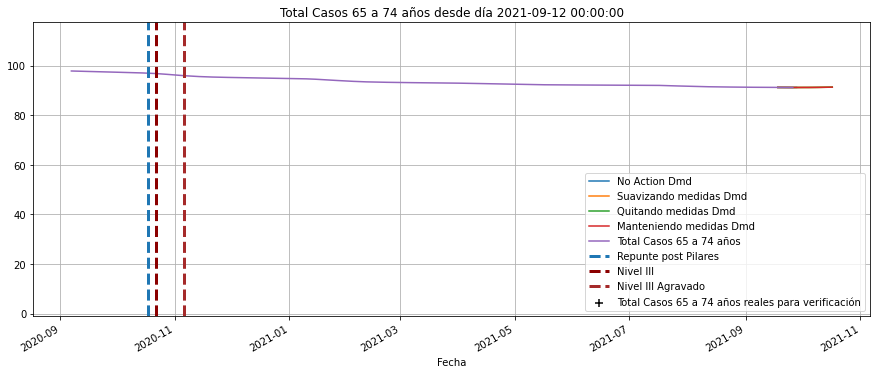

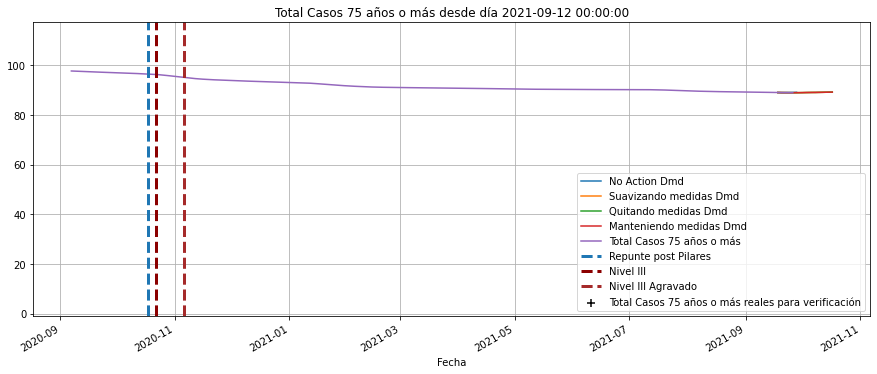

In [44]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    ax.plot(noAction.T.loc[:nuevos.index[-1]].index,
            noAction.T.loc[:nuevos.index[-1]][[i]],axes=ax,label='No Action Dmd')
    ax.plot(kControl.T.index,
            kControl.T[[i]],axes=ax,label='Suavizando medidas Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]],axes=ax,label='Quitando medidas Dmd')
    ax.plot(hard.T.index,
            hard.T[[i]],axes=ax,label='Manteniendo medidas Dmd')
    X_prima.T.shift(0).loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*X_prima.T.loc['2020-9-7':,i].max())
    plt.show()
  

In [45]:
import datetime as datetime

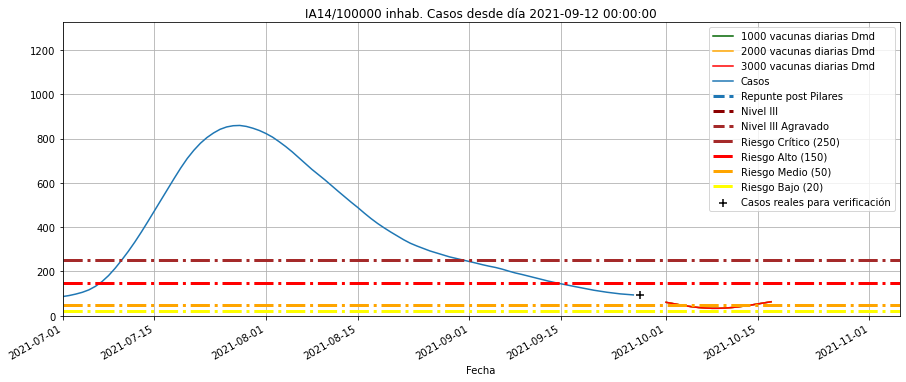

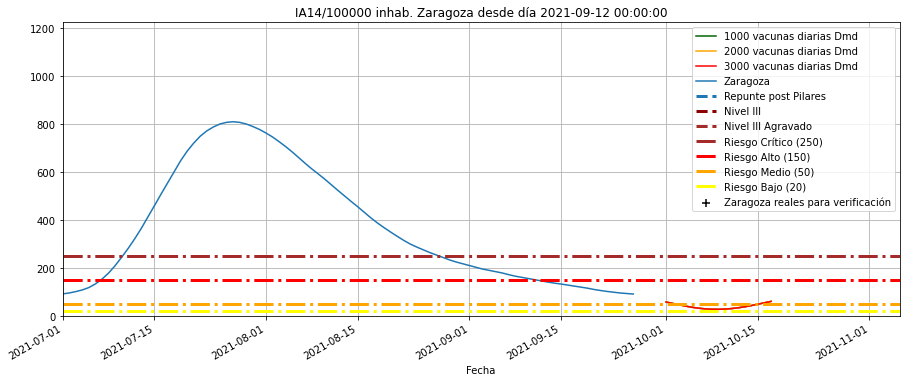

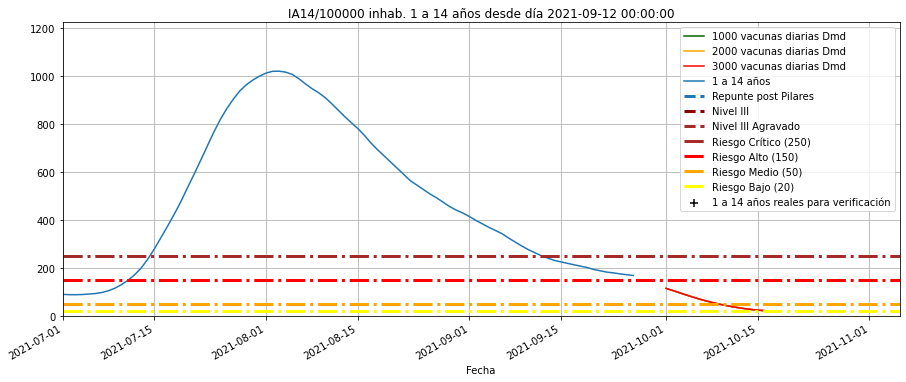

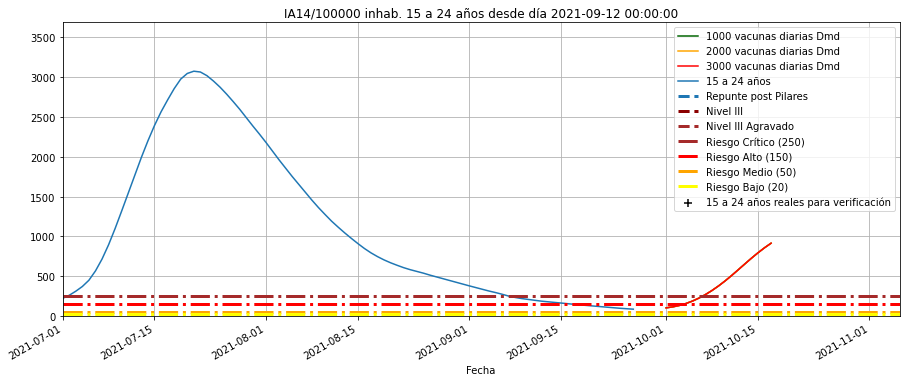

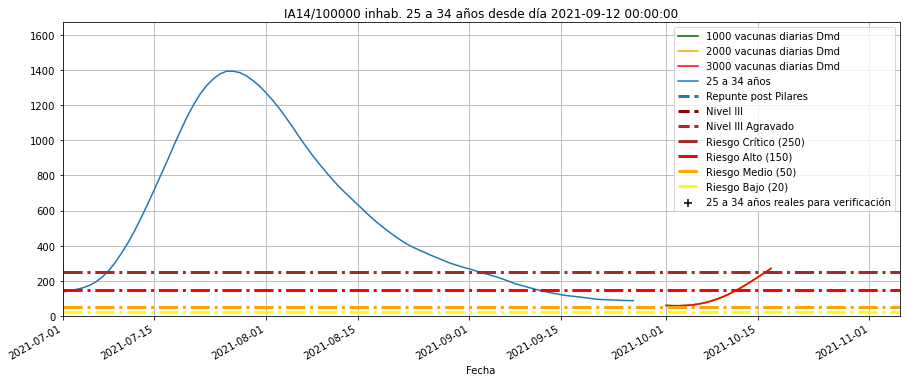

...

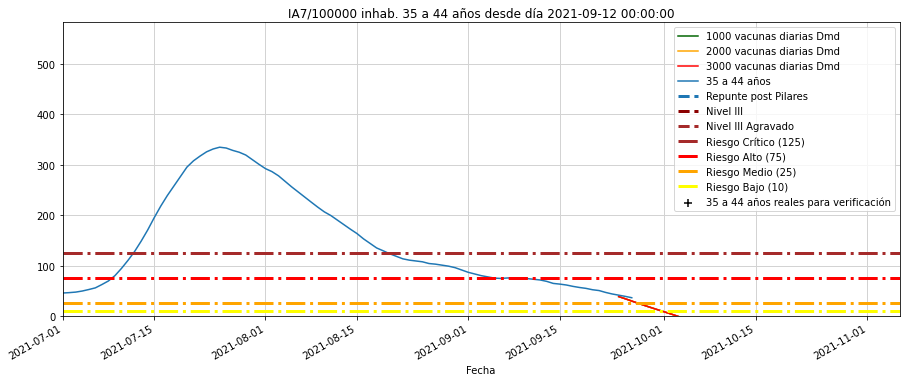

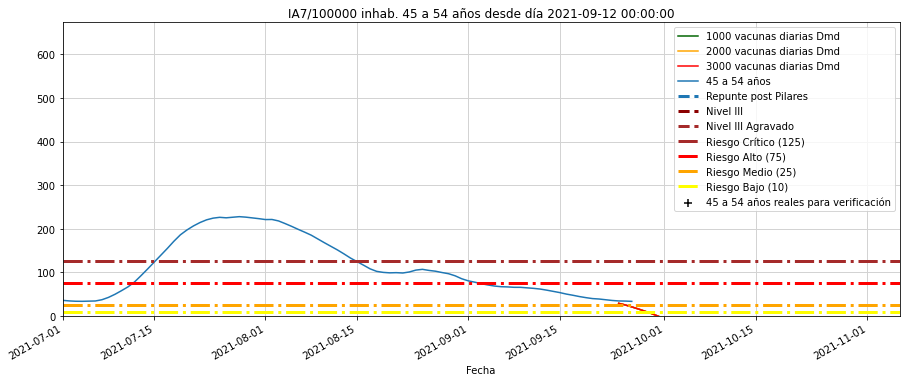

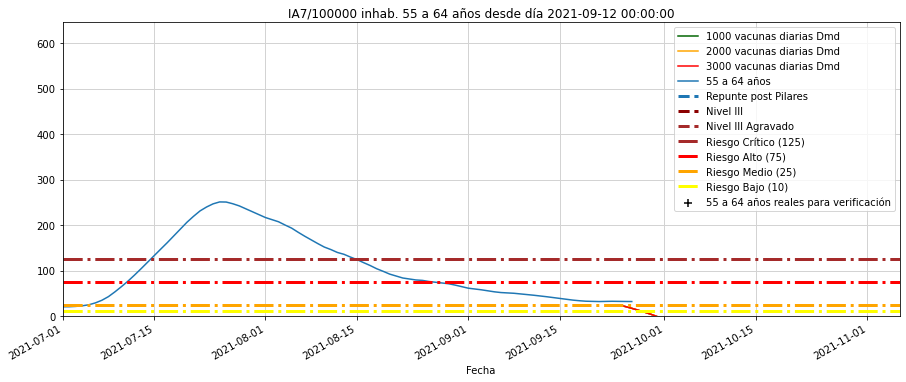

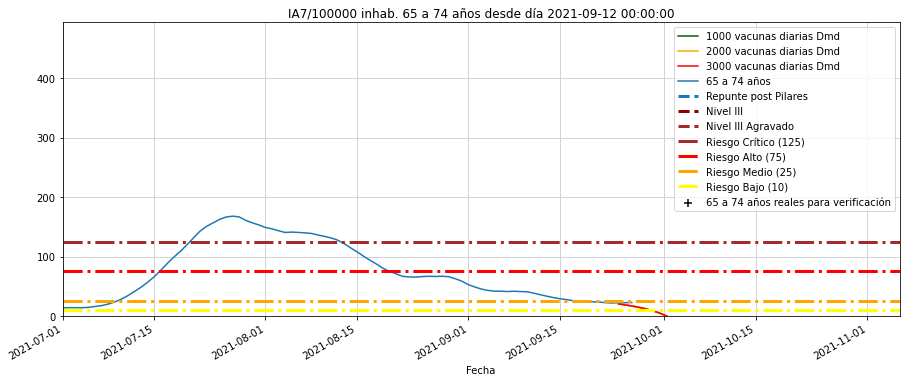

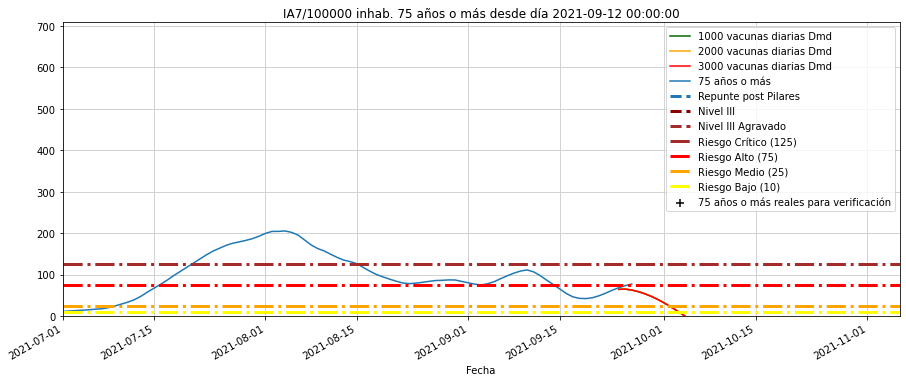

In [46]:
coef = {
    'Casos':13.19,
    #'test coresp':13,
    #'Nº de pacientes a los que se ha realizado pruebas':13,
    #'Asintomáticos':13,
    'Zaragoza':9.6,
    '1 a 14 años':1.58,
    '15 a 24 años':1.24,
    '25 a 34 años':1.42,
    '35 a 44 años':2.01,
    '45 a 54 años':2.06, 
    '55 a 64 años':1.77, 
    '65 a 74 años':1.35,
    '75 años o más':1.50,
}
for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]
            ).loc[nuevos.index[0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(250,lw=3,ls='-.',c='brown',label='Riesgo Crítico (250)')
    ax.axhline(150,lw=3,ls='-.',c='red',label='Riesgo Alto (150)')
    ax.axhline(50,lw=3,ls='-.',c='orange',label='Riesgo Medio (50)')
    ax.axhline(20,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (20)')
    plt.title("IA14/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).max())
    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()

for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #(pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1).T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(7,center=False).sum()/coef[i]
            ).loc[nuevos.index[-0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(125,lw=3,ls='-.',c='brown',label='Riesgo Crítico (125)')
    ax.axhline(75,lw=3,ls='-.',c='red',label='Riesgo Alto (75)')
    ax.axhline(25,lw=3,ls='-.',c='orange',label='Riesgo Medio (25)')
    ax.axhline(10,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (10)')
    plt.title("IA7/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    #plt.grid()
    plt.grid(which='minor',axis ='both', linestyle=':', linewidth='0.5', color='lightgrey')
    plt.grid(which='major',axis ='both', linewidth='1', color='lightgrey')
    plt.ylim(bottom=-1,
             top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).max())
    plt.ylim(bottom=.0*np.max([0,
                           np.min([total.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   kControl.T.loc[:,i].min()])]),
         top=1.1*np.max([total.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         kControl.T.loc[:,i].max()]))

    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()
  

In [47]:
pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)
#nuevos.T.shift(0).loc[X_prima.index[0]:]
#X_prima
i='Casos'
((pd.concat([diario.T,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]).loc[X_prima.T.index[-5]:].round(0)
nuevos.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-27,1,85.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,41.18992,87.765313,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-28,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,41.04086,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
noAction2 = noAction *repartoDiaSemana.loc[noAction.T.index.dayofweek+1,kControl.index].T.values
kControl2 = kControl *repartoDiaSemana.loc[kControl.T.index.dayofweek+1,kControl.index].T.values
rellaxed2 = rellaxed *repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values
hard2 = hard *repartoDiaSemana.loc[hard.T.index.dayofweek+1,kControl.index].T.values
media2 = ((rellaxed.clip(lower=0)+kControl.clip(lower=0)+hard.clip(lower=0))/3.)*repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values

In [49]:
from matplotlib.dates import HourLocator, MonthLocator, YearLocator, WeekdayLocator

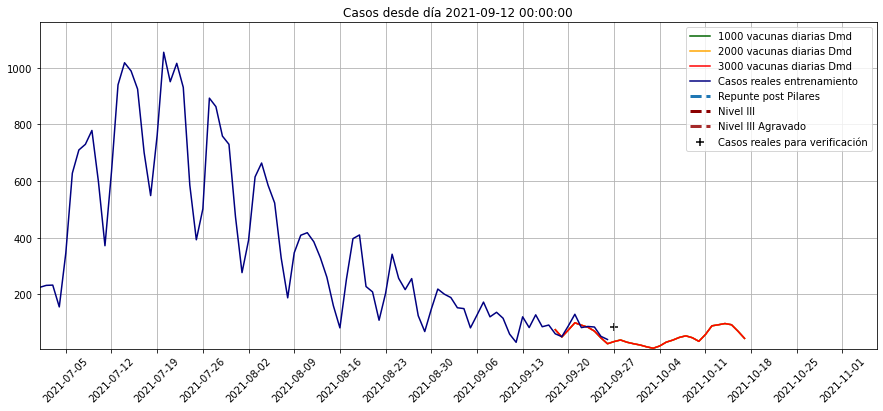

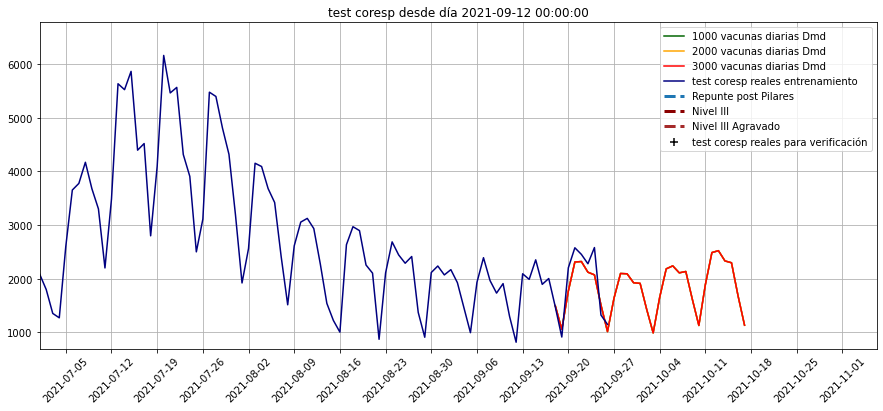

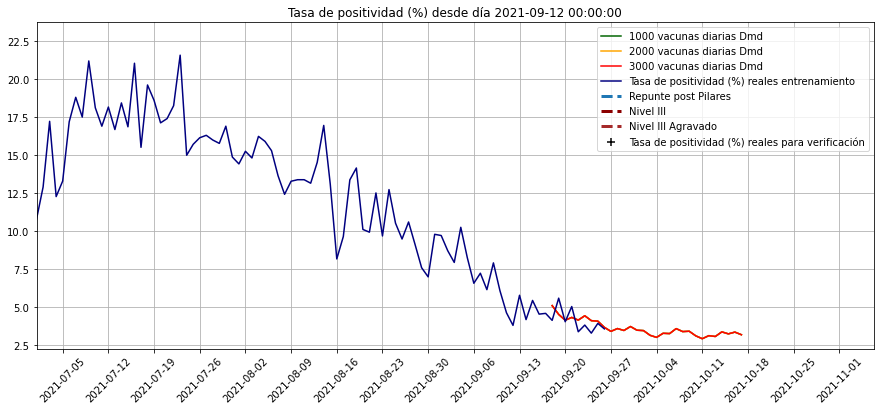

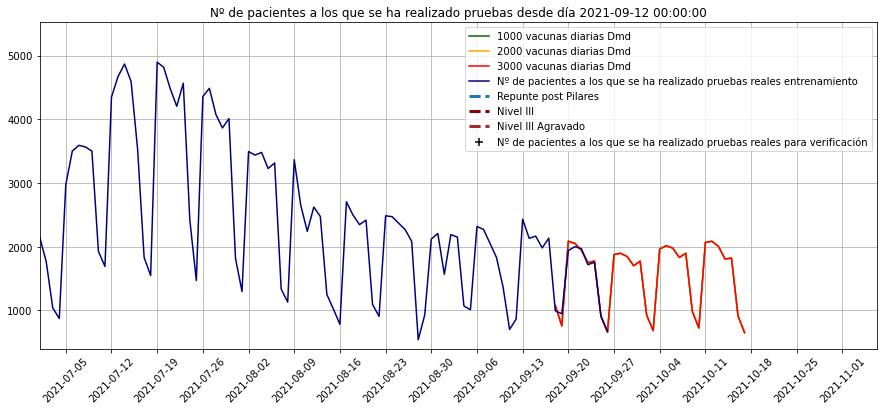

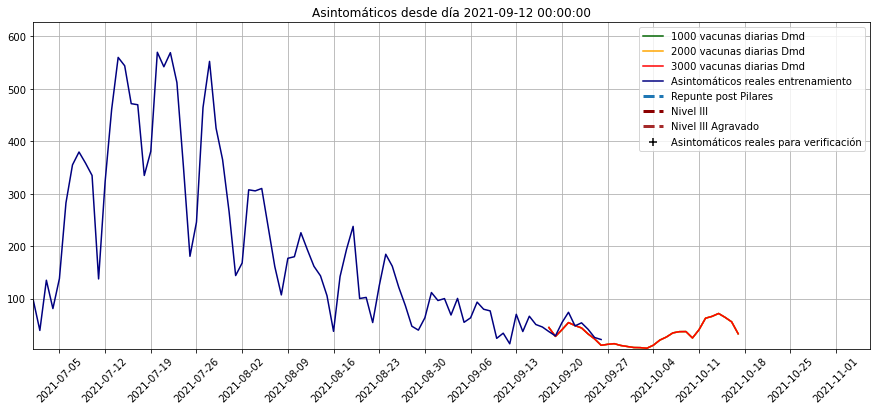

...

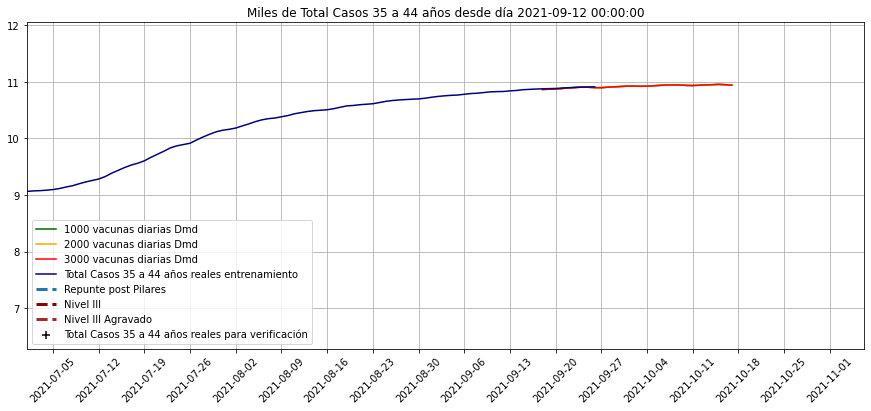

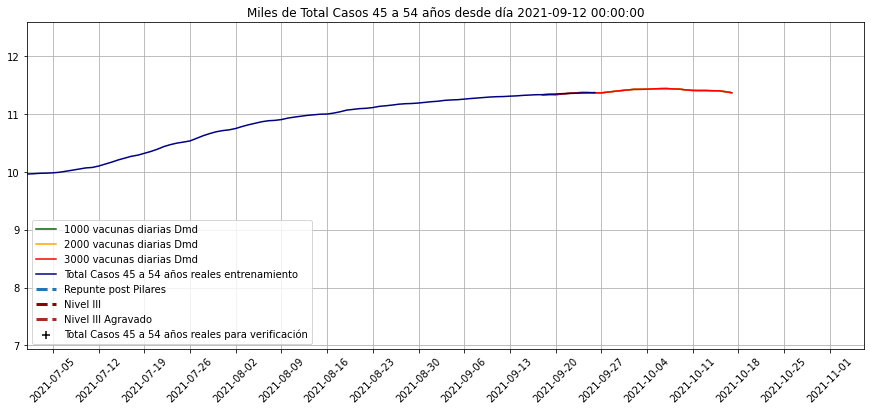

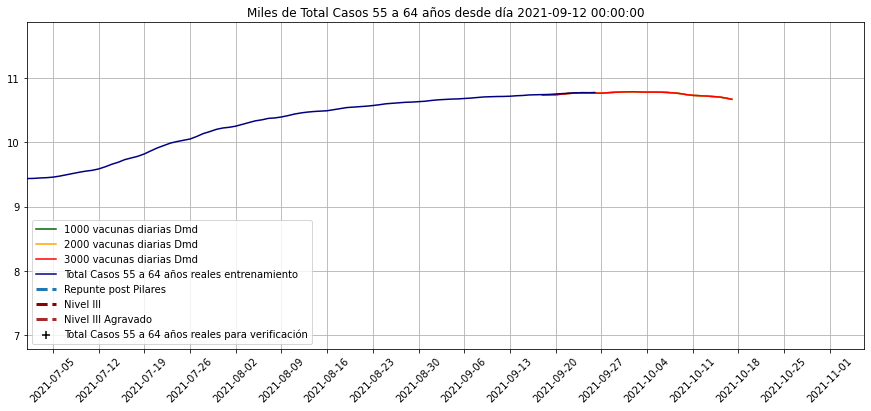

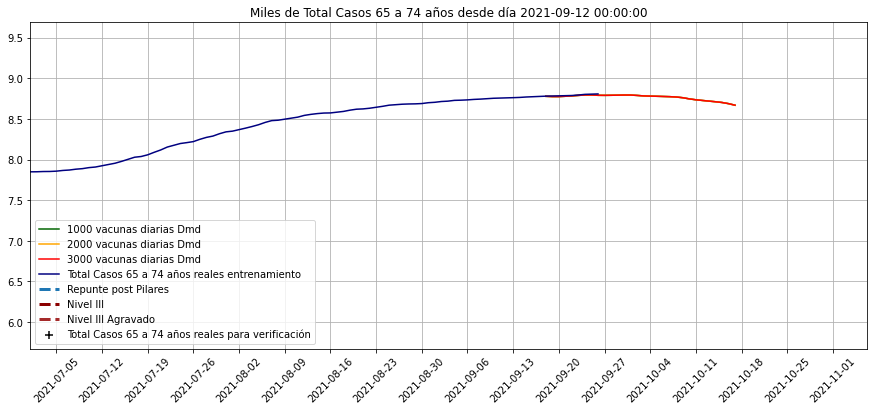

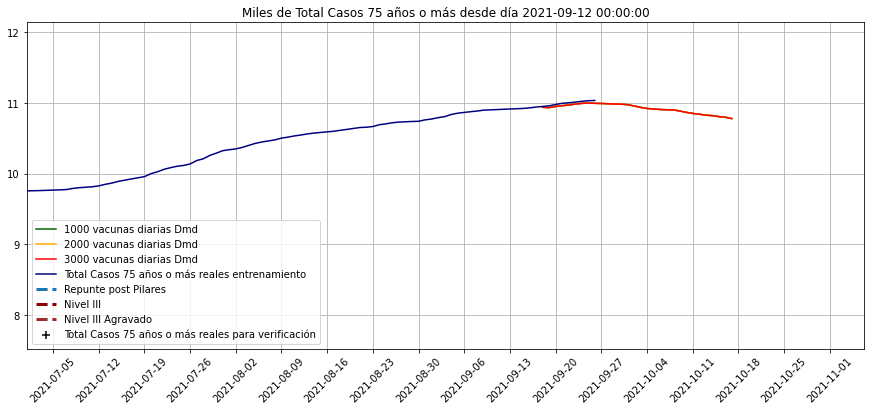

In [50]:
for i in kControl.T.columns[:-9]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=3.0*diario.loc['2021-2':,i].max())
    #plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.75*X_prima.T.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,
                               np.min([diario.loc['2021-2':,i].min(),
                                       #nuevos.loc['2021-2':,i].min(),
                                       kControl2.T.loc['2021-2':,i].min()])]),
             top=1.1*np.max([diario.loc['2021-2':,i].max(),
                                  #nuevos.loc['2021-2':,i].max(),
                                  kControl2.T.loc['2021-2':,i].max()]))


        
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
for i in kControl.T.columns[-9:]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            100-rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            100-kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            100-hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        100-diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            100-nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("Miles de {} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=1.1*diario.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,100-np.max([diario.loc['2021-2':,i].max(),
                                             #nuevos.loc['2021-2':,i].max(),
                                             kControl2.T.loc['2021-2':,i].max()])]),
             top=1.1*(100-np.min([diario.loc['2021-2':,i].min(),
                                  #nuevos.loc['2021-2':,i].min(),
                                  kControl2.T.loc['2021-2':,i].min()])))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
    

In [51]:
kControl2.index

Index(['Casos', 'test coresp', 'Tasa de positividad (%)',
       'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [52]:
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas', 'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-9-20':'2021-10-03'].round(0).astype(int).T.sort_index(ascending=False).to_excel('kControl2.xlsx')
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas', 'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-9-20':'2021-10-03'].round(0).astype(int).T.sort_index(ascending=False)

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos (%),Zaragoza,UCI ocupadas,UCI libres con resp,Camas Ocup,Camas libres,1 a 14 años,15 a 24 años,25 a 34 años,35 a 44 años,45 a 54 años,55 a 64 años,65 a 74 años,75 años o más
2021-10-03,10,990,683,3,54,3,19,110,56,1598,2,15,4,-2,-8,-6,-3,-3
2021-10-02,15,1431,926,3,59,5,20,101,63,1637,5,19,5,-2,-9,-8,-4,-3
2021-10-01,21,1913,1772,3,52,10,20,100,70,1622,7,20,6,-1,-9,-7,-3,0
2021-09-30,26,1925,1702,4,56,15,21,99,78,1472,9,14,5,0,-7,-6,-2,3
2021-09-29,31,2092,1846,3,54,21,21,101,85,1431,10,10,5,2,-4,-4,0,6
2021-09-28,39,2098,1897,4,53,28,22,101,91,1424,12,8,5,3,-2,-2,1,9
2021-09-27,34,1638,1876,3,52,22,23,104,98,1448,7,5,4,3,0,0,1,7
2021-09-26,26,1014,659,4,54,18,24,109,104,1607,5,4,3,3,1,1,1,7
2021-09-25,47,1510,906,4,59,35,24,101,103,1640,11,7,5,5,3,2,2,11
2021-09-24,71,2072,1774,4,52,50,25,100,104,1617,15,11,7,8,5,3,3,14


In [53]:
kControl2.T.head()

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-18,75.573881,1497.592184,5.100171,1076.107237,44.989031,59.638359,53.854792,69.931099,17.287017,6.803429,...,42.792549,87.833437,89.053767,81.290920,86.222044,89.135951,88.668334,89.262848,91.221725,89.063889
2021-09-19,49.797415,1056.406872,4.521828,757.488914,28.080879,54.216228,33.517852,66.224979,8.803337,4.126826,...,42.559869,87.823085,89.056407,81.300740,86.214461,89.131915,88.662700,89.259742,91.224826,89.069304
2021-09-20,74.262598,1769.531005,4.140073,2086.061440,40.818663,52.194674,46.902005,62.270299,13.130114,6.377411,...,42.361197,87.814291,89.046929,81.304620,86.209945,89.129996,88.665528,89.259471,91.224961,89.052247
2021-09-21,100.025638,2311.945576,4.322531,2051.802055,54.401303,52.666636,69.696066,68.289894,21.784075,10.033644,...,42.166939,87.806345,89.032363,81.291424,86.195614,89.118788,88.654717,89.249243,91.221117,89.041372
2021-09-22,91.514566,2320.541866,4.146882,1946.764726,48.774056,53.463077,64.961415,69.969530,19.100115,11.085756,...,41.973485,87.799101,89.019446,81.274369,86.182917,89.108830,88.643457,89.239627,91.216280,89.032509


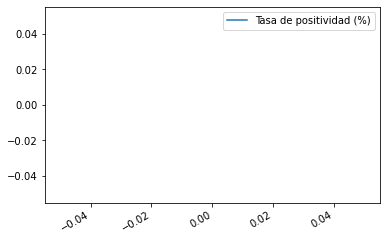

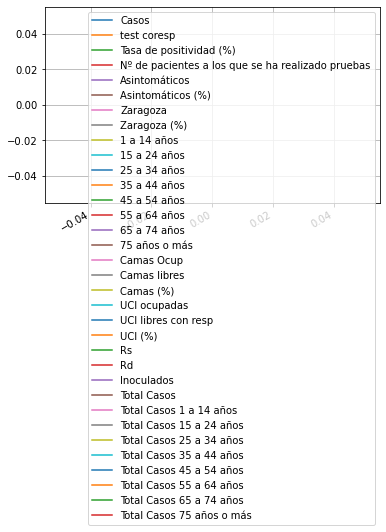

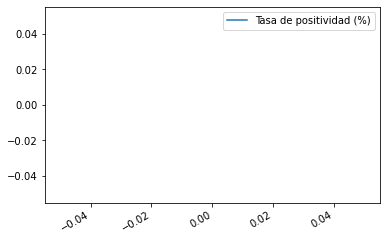

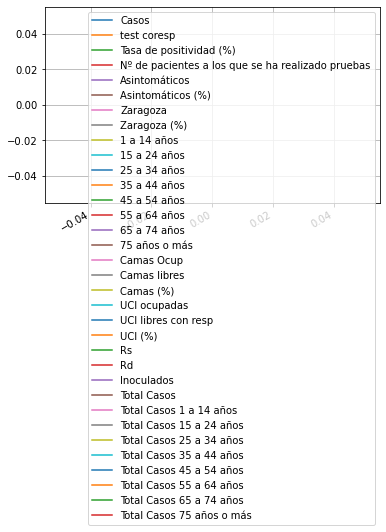

In [54]:
hard2.T.loc['2020-10-1':'2021-3-27',['Tasa de positividad (%)']].plot()
(hard2.T.loc['2020-10-1':'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()
plt.show()
kControl2.T.loc[:'2021-3-27',['Tasa de positividad (%)']].plot()
(kControl2.T.loc[:'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()#goto

In [55]:
diario.loc['2020-10-1':].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)

Fecha
2020-10-01    10.849057
2020-10-02    10.931583
2020-10-03    10.202768
2020-10-04    12.485459
2020-10-05    11.167315
                ...    
2021-09-22     3.382233
2021-09-23     3.817464
2021-09-24     3.293297
2021-09-25     3.933434
2021-09-26     3.568320
Length: 361, dtype: float64

<AxesSubplot:xlabel='Fecha'>

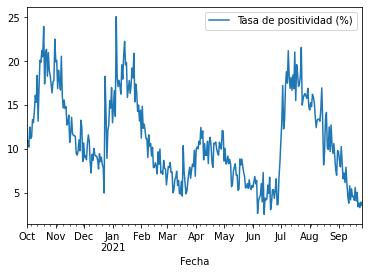

In [56]:
diario.loc['2020-10-1':,['Tasa de positividad (%)']].plot()

In [57]:
((kControl2.T-nuevos)*100./nuevos).dropna(axis=0,how='all').dropna(axis=1,how='all').describe().T

,count,mean,std,min,25%,50%,75%,max
Casos,1.0,-60.514161,NaN,-60.514161,-60.514161,-60.514161,-60.514161,-60.514161
Inoculados,2.0,-0.226012,0.030854,-0.247829,-0.236921,-0.226012,-0.215104,-0.204196
Rd,1.0,-17.859553,NaN,-17.859553,-17.859553,-17.859553,-17.859553,-17.859553
Rs,1.0,-13.355198,NaN,-13.355198,-13.355198,-13.355198,-13.355198,-13.355198
Total Casos,1.0,0.012132,NaN,0.012132,0.012132,0.012132,0.012132,0.012132


In [58]:
nuevos['Nº de pacientes a los que se ha realizado pruebas']

Fecha
2021-09-27   NaN
2021-09-28   NaN
Name: Nº de pacientes a los que se ha realizado pruebas, dtype: float64

<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

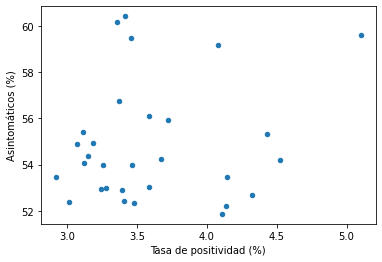

In [59]:
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter')

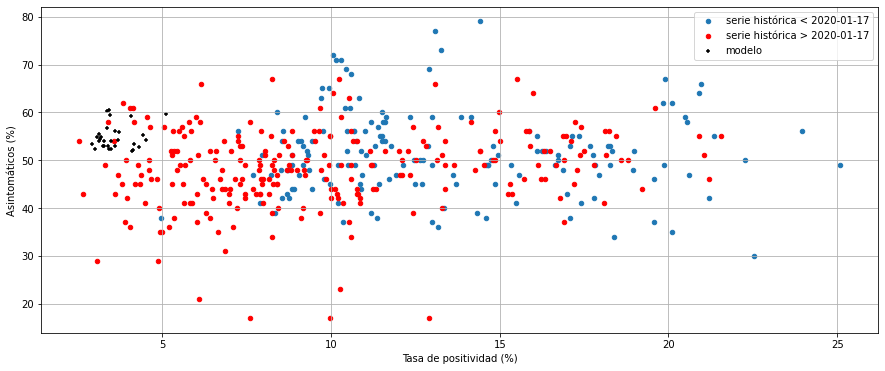

In [60]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-01-17',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-01-17',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [61]:
kControl2.T.columns

Index(['Casos', 'test coresp', 'Tasa de positividad (%)',
       'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [62]:
total.T

Fecha,2020-08-14,2020-08-15,2020-08-16,2020-08-17,2020-08-18,2020-08-19,2020-08-20,2020-08-21,2020-08-22,2020-08-23,...,2021-09-19,2021-09-20,2021-09-21,2021-09-22,2021-09-23,2021-09-24,2021-09-25,2021-09-26,2021-09-27,2021-09-28
Día de la semana,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,...,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000
Casos,624.000000,482.000000,390.000000,396.000000,467.000000,347.000000,3.570000e+02,272.000000,493.000000,230.000000,...,51.000000,89.000000,130.000000,83.000000,8.700000e+01,85.000000,52.000000,41.000000,85.000000,NaN
test coresp,4177.000000,3243.000000,3158.000000,3408.000000,4029.000000,3027.000000,3.191000e+03,2796.000000,4546.000000,1997.000000,...,913.000000,2203.000000,2577.000000,2454.000000,2.279000e+03,2581.000000,1322.000000,1149.000000,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,3481.000000,1907.000000,1168.000000,3189.000000,3580.000000,2963.000000,3.219000e+03,2821.000000,1392.000000,617.000000,...,947.000000,1938.000000,2000.000000,1969.000000,1.717000e+03,1755.000000,911.000000,668.000000,NaN,NaN
Tasa de positividad (%),14.940000,14.860000,12.350000,11.620000,11.590000,11.460000,1.119000e+01,9.730000,10.840000,11.520000,...,5.590000,4.040000,5.040000,3.380000,3.820000e+00,3.290000,3.930000,3.570000,NaN,NaN
Asintomáticos,318.240000,216.900000,230.100000,233.640000,270.860000,190.850000,2.070600e+02,176.800000,310.590000,138.000000,...,29.070000,54.290000,74.100000,48.140000,5.394000e+01,41.650000,26.000000,22.140000,NaN,NaN
Zaragoza,541.000000,428.000000,338.000000,307.000000,394.000000,262.000000,2.800000e+02,217.000000,412.000000,191.000000,...,27.000000,44.000000,105.000000,67.000000,6.100000e+01,59.000000,45.000000,29.000000,NaN,NaN
1 a 14 años,96.000000,67.000000,53.000000,51.000000,49.000000,46.000000,4.600000e+01,41.000000,58.000000,21.000000,...,5.000000,15.000000,34.000000,18.000000,1.900000e+01,13.000000,12.000000,11.000000,NaN,NaN
15 a 24 años,78.000000,51.000000,54.000000,41.000000,50.000000,42.000000,4.200000e+01,29.000000,59.000000,28.000000,...,6.000000,3.000000,5.000000,8.000000,8.000000e+00,4.000000,4.000000,2.000000,NaN,NaN
25 a 34 años,85.000000,64.000000,38.000000,40.000000,72.000000,58.000000,5.800000e+01,44.000000,47.000000,25.000000,...,2.000000,9.000000,20.000000,9.000000,6.000000e+00,17.000000,4.000000,3.000000,NaN,NaN


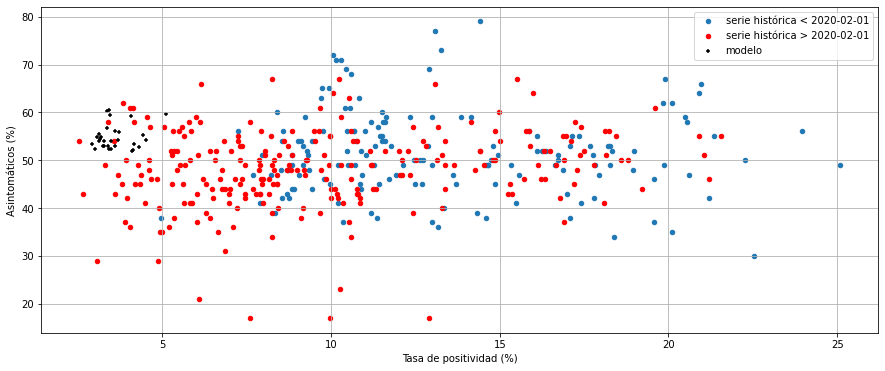

In [63]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-02-01',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-02-01',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [64]:
def histogram_intersection(a, b):
    v = np.minimum(a, b).sum().round(decimals=1)
    return v

total[['Tasa de positividad (%)','Asintomáticos (%)']].corr(min_periods=2)


,Tasa de positividad (%),Asintomáticos (%)
Tasa de positividad (%),1.000000,0.153441
Asintomáticos (%),0.153441,1.000000


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

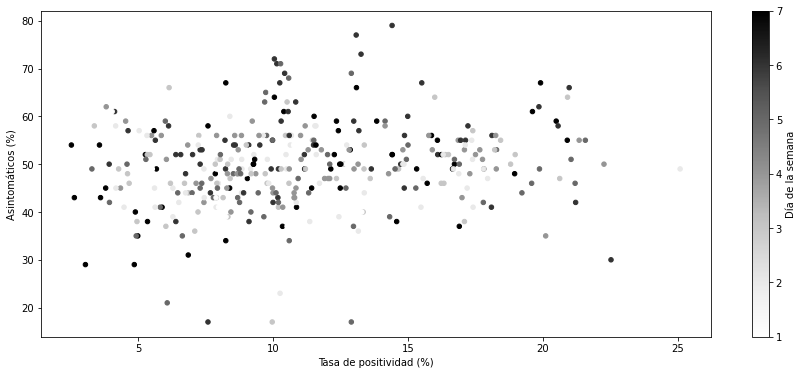

In [65]:
fig, ax = plt.subplots(figsize=(15,6))
total.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

In [66]:
kControl2.loc['Día de la semana',:] = pd.to_datetime(kControl2.columns.values).weekday+1

In [67]:
kControl2

,2021-09-18,2021-09-19,2021-09-20,2021-09-21,2021-09-22,2021-09-23,2021-09-24,2021-09-25,2021-09-26,2021-09-27,...,2021-10-08,2021-10-09,2021-10-10,2021-10-11,2021-10-12,2021-10-13,2021-10-14,2021-10-15,2021-10-16,2021-10-17
Casos,75.573881,49.797415,74.262598,100.025638,91.514566,84.193797,70.611486,46.642417,25.989314,33.562963,...,53.846296,47.193451,34.515194,58.273795,89.239662,92.962782,97.277013,93.064765,70.161258,44.935821
test coresp,1497.592184,1056.406872,1769.531005,2311.945576,2320.541866,2121.637915,2072.092421,1510.152795,1014.160151,1638.219343,...,2134.898425,1616.766124,1128.382388,1890.956889,2487.946061,2523.033072,2331.673811,2297.825237,1684.406215,1133.150434
Tasa de positividad (%),5.100171,4.521828,4.140073,4.322531,4.146882,4.433165,4.111474,4.077360,3.671343,3.406623,...,3.391893,3.414949,3.113448,2.923050,3.123539,3.069789,3.373021,3.242370,3.357613,3.185362
Nº de pacientes a los que se ha realizado pruebas,1076.107237,757.488914,2086.061440,2051.802055,1946.764726,1749.867870,1774.420865,905.788309,659.115369,1875.579290,...,1896.677376,984.337624,723.182181,2067.001655,2084.777486,2005.451321,1807.214942,1820.532781,914.426262,650.709483
Asintomáticos,44.989031,28.080879,40.818663,54.401303,48.774056,44.167989,32.812088,23.293671,11.147324,12.952763,...,37.131289,37.285604,25.079393,40.817107,62.768123,66.262606,71.775984,64.355205,55.848577,33.095404
Asintomáticos (%),59.638359,54.216228,52.194674,52.666636,53.463077,55.345541,51.861197,59.180646,54.263086,52.423919,...,52.891895,60.434479,55.414538,53.467367,54.048878,54.884925,56.768410,52.941658,60.177618,54.923250
Zaragoza,53.854792,33.517852,46.902005,69.696066,64.961415,59.348977,50.172143,34.778608,18.288641,22.151121,...,33.865374,32.736918,23.393989,37.981561,65.356850,70.138045,73.271481,70.570702,55.592630,33.347459
Zaragoza (%),69.931099,66.224979,62.270299,68.289894,69.969530,69.710175,70.218726,72.700734,68.572639,64.129030,...,71.433206,74.205243,70.281916,66.022739,72.382763,74.132464,73.822068,74.257599,76.812136,72.370573
1 a 14 años,17.287017,8.803337,13.130114,21.784075,19.100115,17.534293,15.483549,11.013970,5.123611,7.281280,...,2.450441,1.774554,0.868260,1.325315,2.345098,2.253878,2.284694,2.234737,1.728805,0.862657
15 a 24 años,6.803429,4.126826,6.377411,10.033644,11.085756,11.344656,10.651288,7.124812,4.050896,5.180090,...,85.426557,65.630573,44.334101,71.062512,111.951479,122.730762,125.182020,119.126008,83.291081,51.871245


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

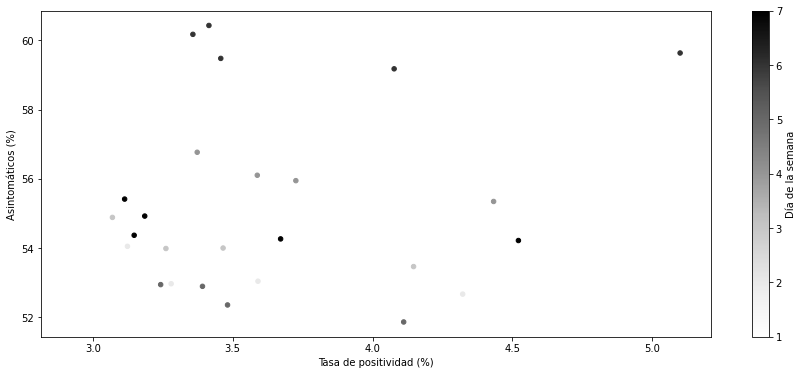

In [68]:
fig, ax = plt.subplots(figsize=(15,6))
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

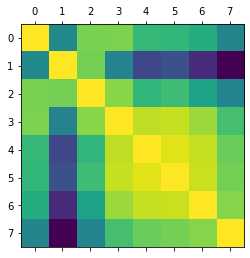

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [69]:
plt.matshow(total[[ '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].corr())
plt.show()
total.columns

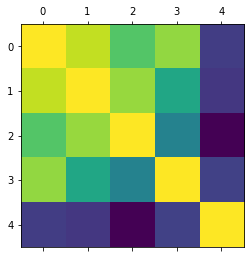

In [70]:
plt.matshow(total[[ 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos (%)']].corr(min_periods=21))
plt.show()

(1.0, 28.0)

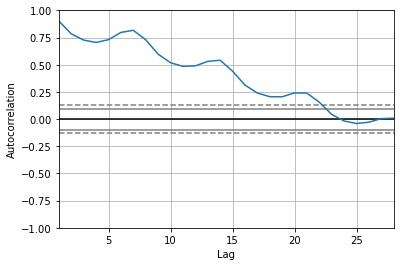

In [71]:
s = diario.Casos
pd.plotting.autocorrelation_plot(s)
plt.xlim(right=28)

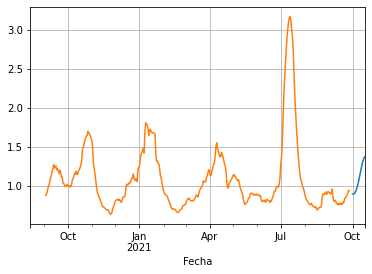

In [72]:
kControl2.T.Rd.rolling(14).mean().plot()
total.Rd.rolling(14).mean().plot()
plt.grid()

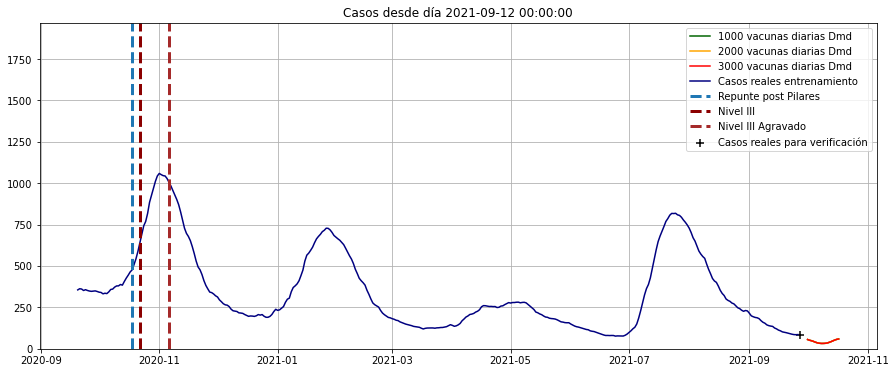

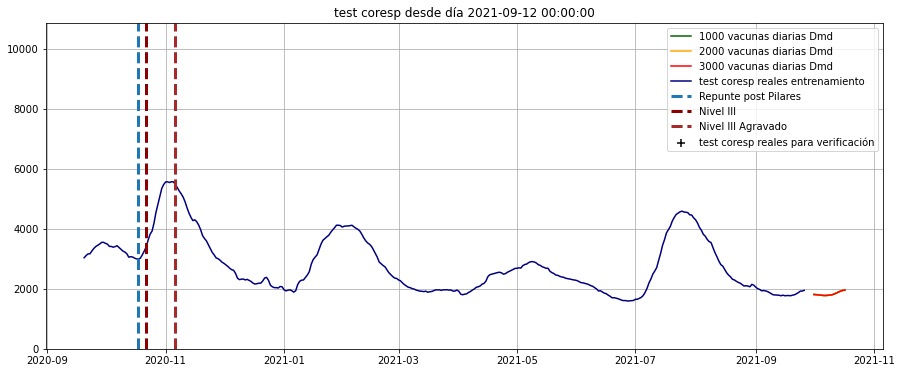

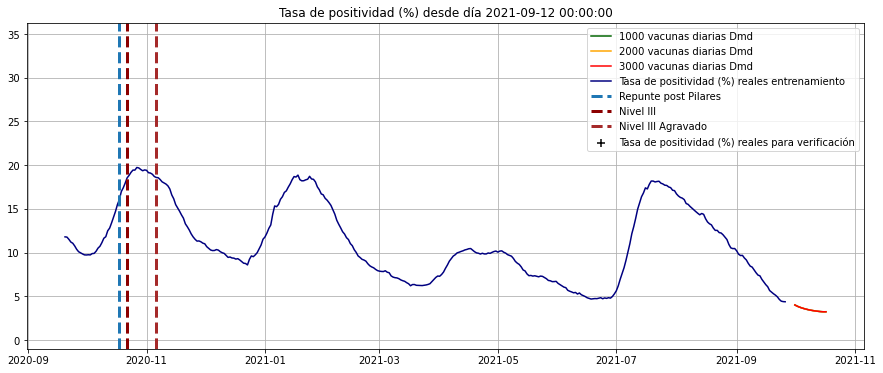

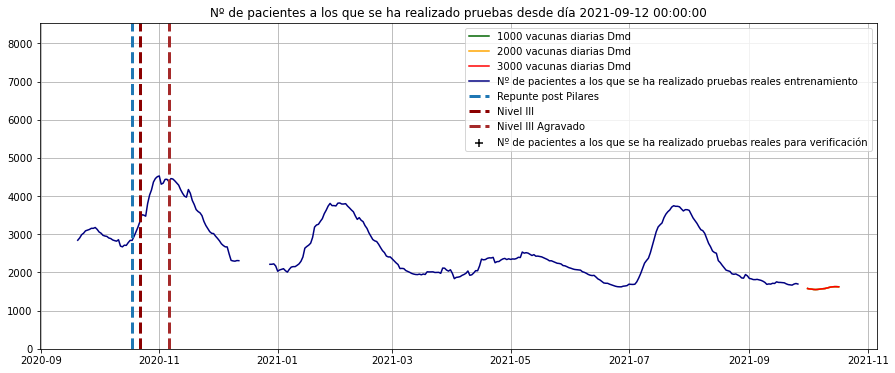

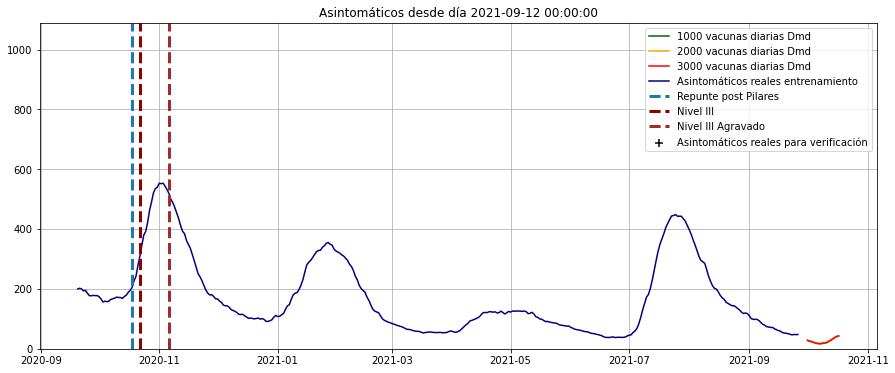

...

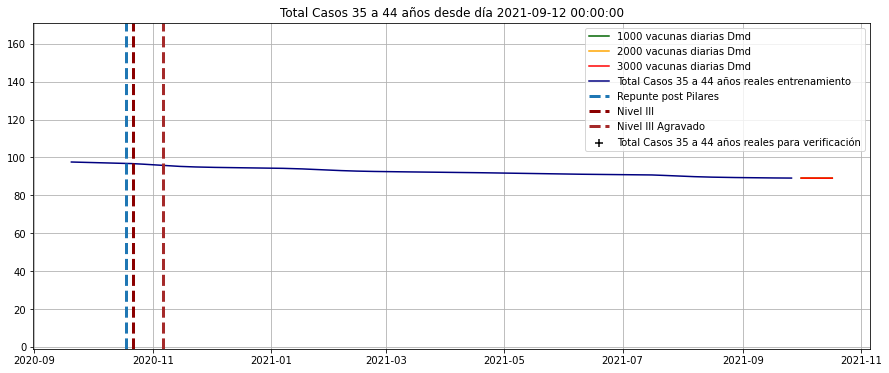

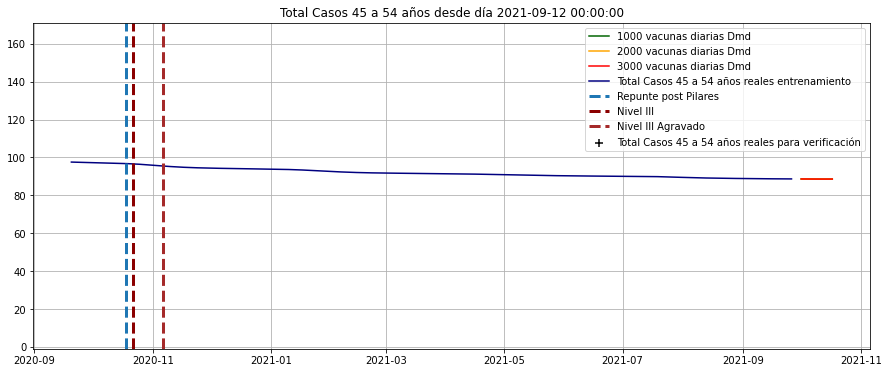

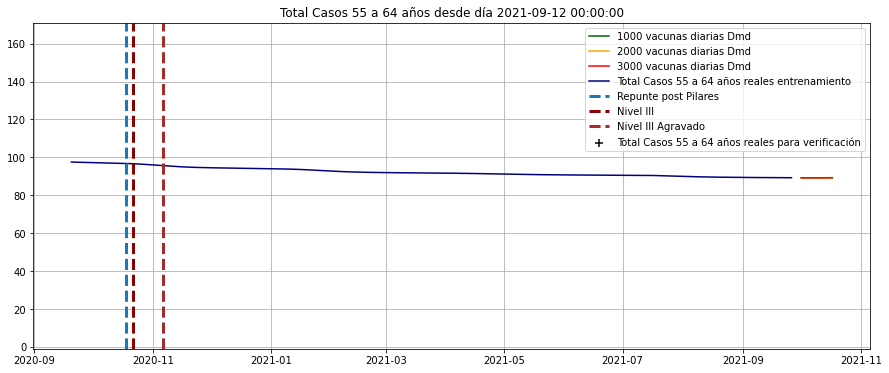

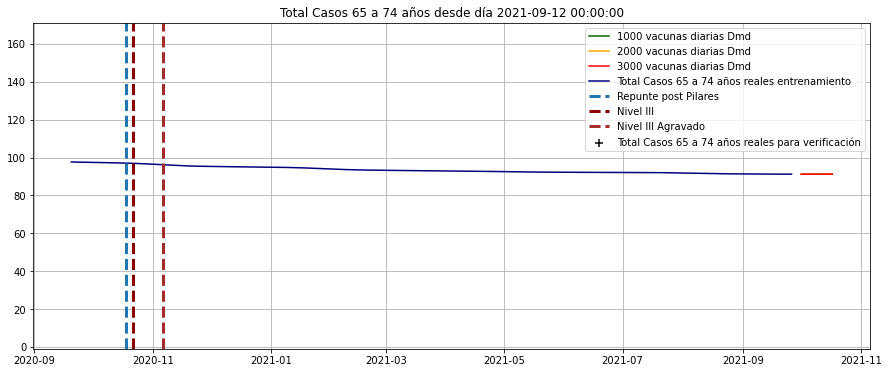

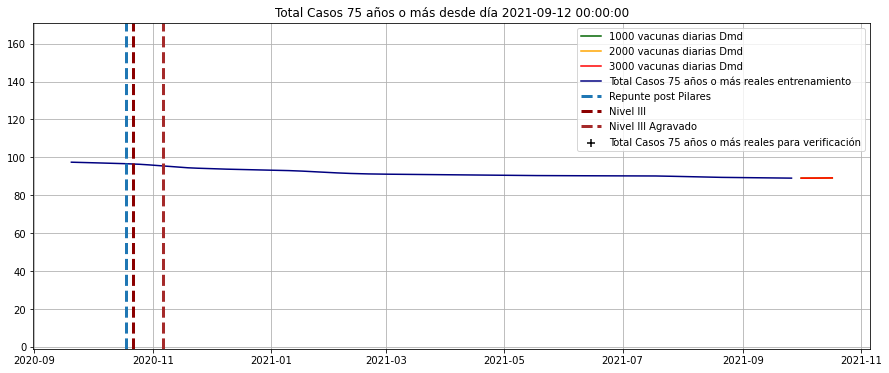

In [73]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]].rolling(14).mean(),axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]].rolling(14).mean(),axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]].rolling(14).mean(),axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]].rolling(14).mean(),axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=-1,top=1.75*X_prima.T.loc['2020-9-7':,i].max())
    plt.grid()
    plt.show()

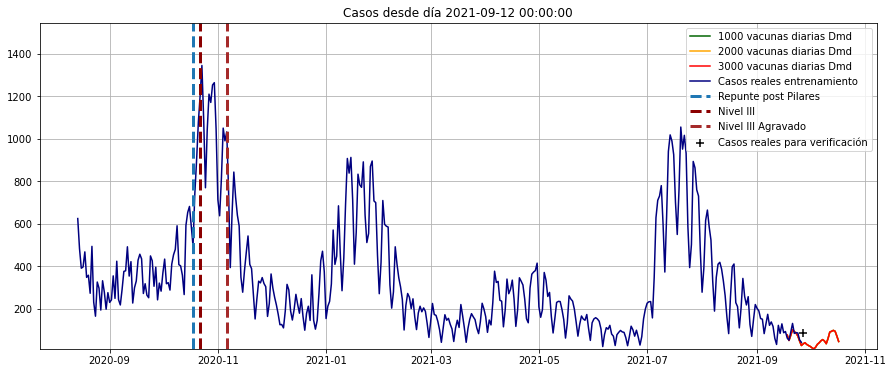

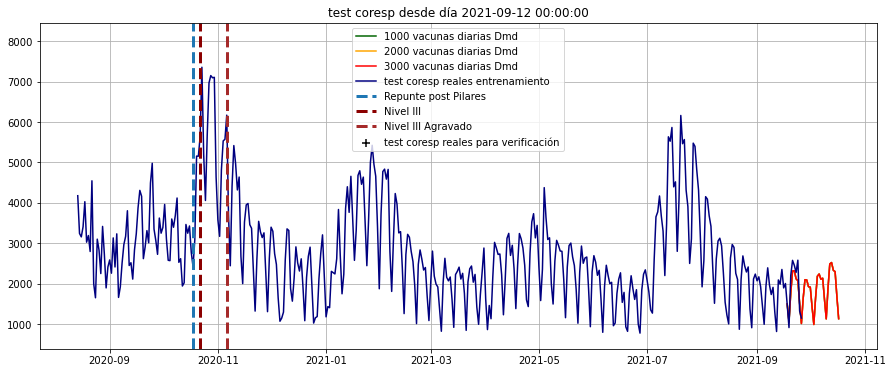

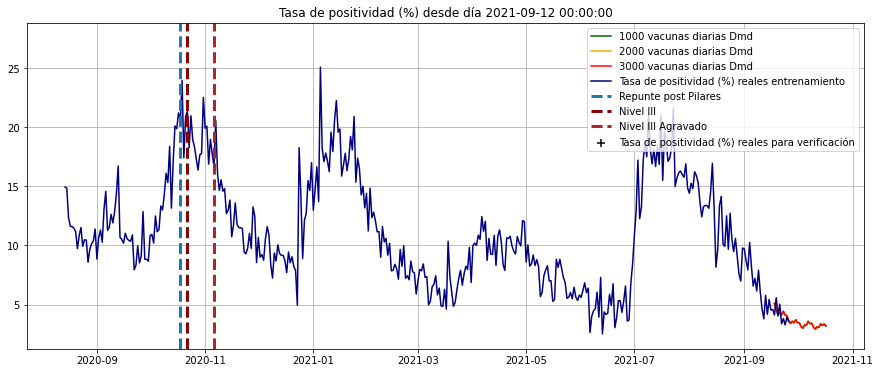

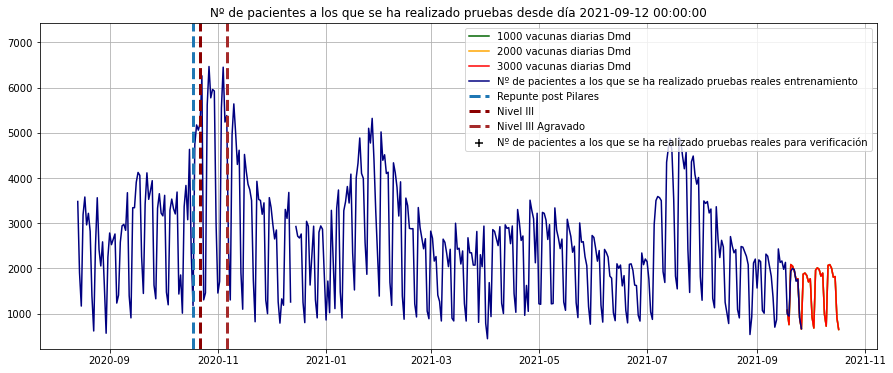

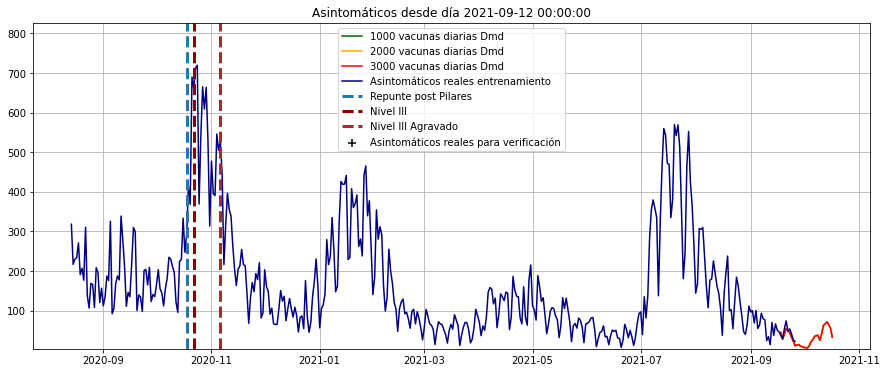

...

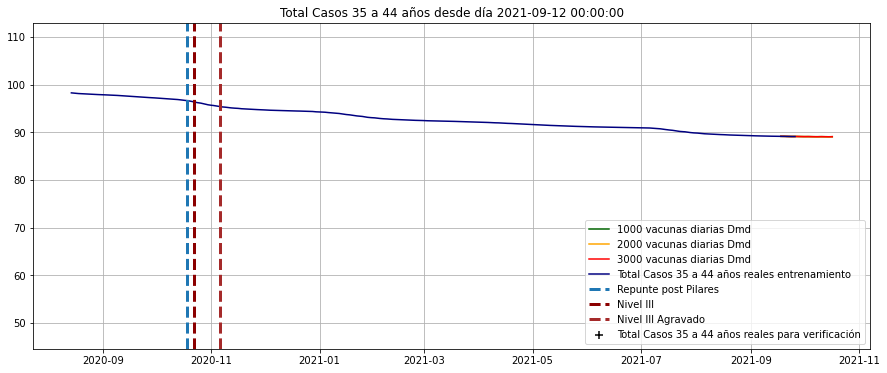

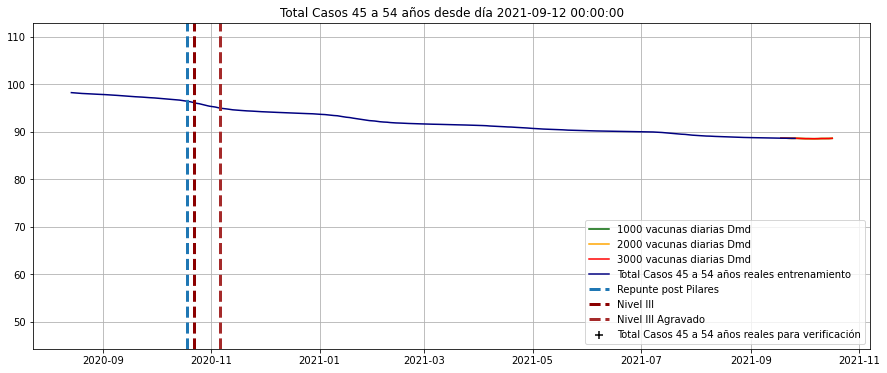

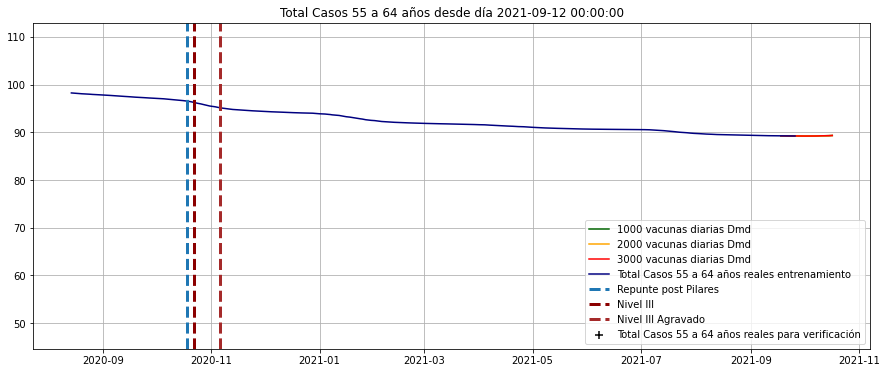

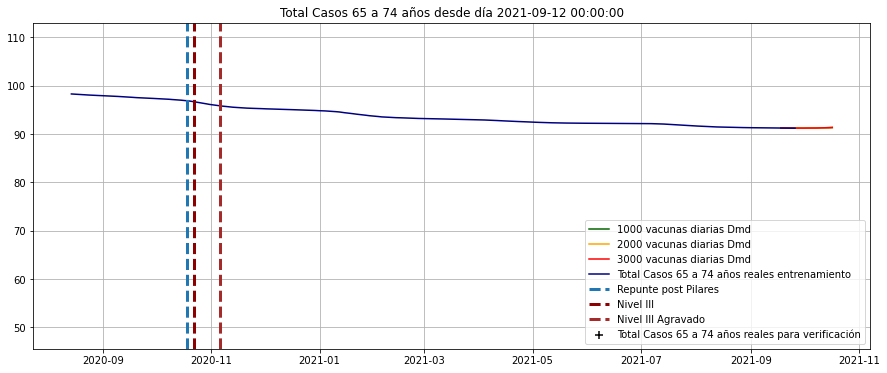

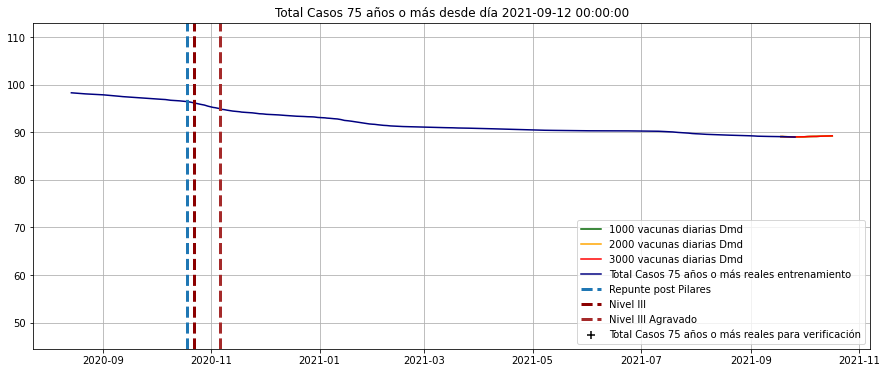

In [74]:
#for i in ['Casos',
#          'test coresp', #'Tasa de positividad (%)',
#          #'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
#          #'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
#          #'15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#          #'55 a 64 años', '65 a 74 años', '75 años o más', 
#          #'Camas Ocup', 'Camas libres', 'Camas (%)', 
#          'UCI ocupadas', 'UCI libres con resp', 'UCI (%)', 
#          #'Rs', 'Rd',
#          #'Inoculados', 'Total Casos'
#         ]:
for i in kControl.T.columns:
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc[:].index,
        diario.loc[:,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc[:].index,
            nuevos.loc[:,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.15*total.loc[:,i].max())
    #plt.xlim(left=pd.Timestamp('2021-2'))
    plt.grid()
    plt.show()
  

In [75]:
kControl.T.columns


Index(['Casos', 'test coresp', 'Tasa de positividad (%)',
       'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [76]:
entrenoDesde = '2020-08-16'
entrenoDesde = '2021-03-19'
entrenoHasta = '2021-04-29'
#X = Omega.loc[['Casos', 'test coresp', #'Tasa de positividad (%)',
#       'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)']].iloc[:,:nAjuste]
#X.loc['Bias',:] = 1
variablesAjuste = ['Casos', 'test coresp', #'Tasa de positividad (%)',
       'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                  ]
X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
#X_total.loc['Bias',:] = 1
X = X_total.loc[:,:entrenoHasta]
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Nº de pacientes a los que se ha realizado pruebas,2387.0,1223.0,837.0,2679.0,2347.0,2346.0,2074.0,2074.0,2818.0,808.0,...,3008.0,2619.0,2718.0,963.0,1624.0,1051.0,3510.0,3284.0,3099.0,2125.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


In [77]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Asintomáticos (%)
Fecha,,,,
2021-03-19,-0.000652,0.000060,7.254584e-06,0.000328
2021-03-20,-0.000885,0.000108,-4.875047e-05,0.001796
2021-03-21,-0.000479,0.000036,-3.683150e-06,0.001026
2021-03-22,-0.001127,0.000092,3.367971e-05,-0.000366
2021-03-23,-0.001234,0.000166,-2.271591e-05,-0.000903
2021-03-24,-0.000944,0.000135,-2.085278e-05,-0.000761
2021-03-25,-0.000433,0.000038,4.357593e-06,0.000499
2021-03-26,-0.001111,0.000165,-3.183031e-05,-0.001022
2021-03-27,0.000046,-0.000109,1.199182e-04,-0.000126


In [78]:
#X_prima.loc[['Casos']].iloc[:,-nAjuste:]
X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
X_prima = X_prima_total.loc[X.columns,['Casos']].T
X_prima

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,138.0,...,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0,414.0


In [79]:
A = X_prima.loc[['Casos']].dot( X_pinv)
A

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Asintomáticos (%)
Casos,1.017083,-0.082718,0.065737,1.055185


In [80]:
#A.dot(pd.DataFrame([372,3732,3099,17,1],index=X.index))
display(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision = A.dot(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision.columns = ultimaPrevision.columns + pd.Timedelta(1,unit='D')
ultimaPrevision

Fecha,2021-09-26
Casos,41.0
test coresp,1149.0
Nº de pacientes a los que se ha realizado pruebas,668.0
Asintomáticos (%),54.0


Fecha,2021-09-27
Casos,47.549559


In [81]:
def verPrevision(fecha=['2021-05-01'],debug=False,A=A):
    dato = total.T.loc[X.index].loc[:,pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D')]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    prevision.index = ['Casos est. linal']
    return prevision.T
verPrevision(['2021-05-03'])

,Casos est. linal
Fecha,
2021-05-03,177.732637


In [82]:
verPrevision(['2021-04-17','2021-04-18','2021-04-19','2021-04-20'])

,Casos est. linal
Fecha,
2021-04-17,335.316930
2021-04-18,209.537658
2021-04-19,118.774980
2021-04-20,256.495909


In [83]:
Casos = total.loc['2020-08-16':,['Casos']].dropna()
Casos = pd.concat([Casos,verPrevision(Casos.index)],axis=1)
Casos

,Casos,Casos est. linal
Fecha,,
2020-08-16,390.0,394.823012
2020-08-17,396.0,274.475073
2020-08-18,467.0,392.753203
2020-08-19,347.0,438.246145
2020-08-20,357.0,355.354430
...,...,...
2021-09-23,87.0,72.064648
2021-09-24,85.0,78.263619
2021-09-25,52.0,40.029122


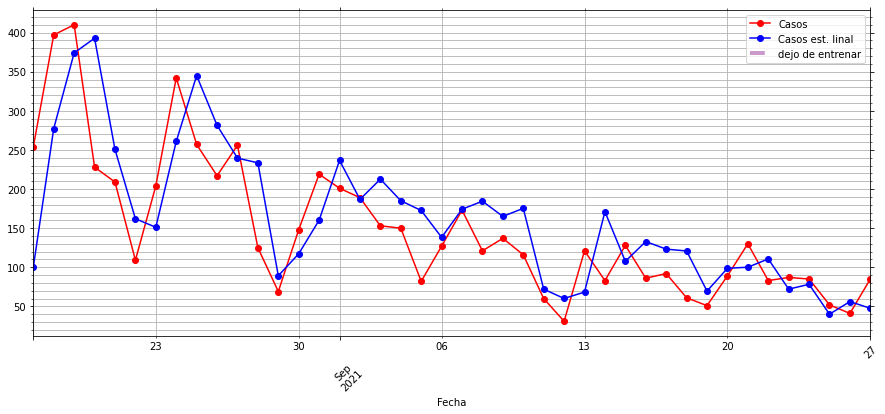

In [84]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-42:].plot(color=['r','b'],style='-o',ax=ax)
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

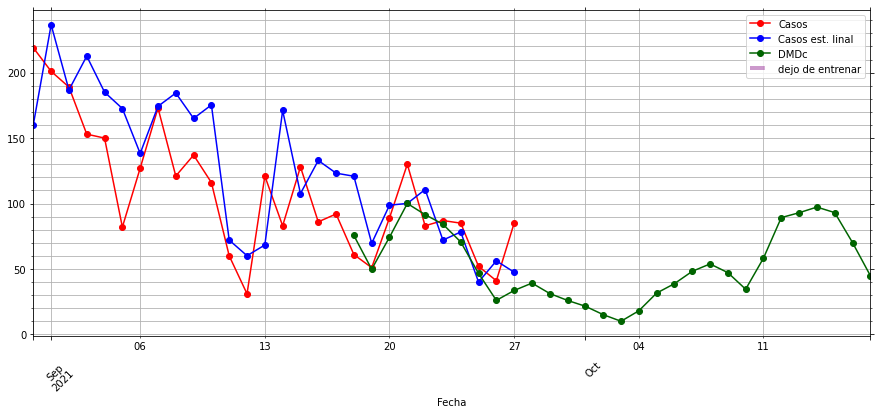

In [85]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['r','b'],style='-o',ax=ax)
kControl2.loc['Casos',
              :#Casos.iloc[-42:].index[-1]
             ].iloc[:35].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

In [86]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(3.1967070428066156, 104.15679252926125)

In [87]:
def estimadorCasos(entrenoDesde = '2021-03-19',entrenoHasta = '2021-04-29',
                  variablesAjuste = [
                      'Casos', 'test coresp', #'Tasa de positividad (%)',
                      'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)',
                      #'Asintomaticos',
                      #'UCI ocupadas','Camas Ocup',
                      #'Bias',
                  ],
                   plot=True,debug=False
                  ):

    X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
    #X_total.loc['Bias',:] = 1
    
    X = X_total.loc[:,:entrenoHasta].copy()
    X = total[variablesAjuste].loc[entrenoDesde:entrenoHasta].dropna(axis=0).T
    if debug:
        display(X_total) 
    X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
    
    X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
    X_prima = X_prima_total.loc[X.columns,['Casos']].T
    
    A = X_prima.loc[['Casos']].dot( X_pinv)
    
    Casos = total.loc['2020-08-15':,['Casos']].dropna()
    Casos = pd.concat([Casos,verPrevision(Casos.index,A=A)],axis=1)
    
    if plot:
        fig, ax = plt.subplots(figsize=(15,6))


        Casos.iloc[-30:].plot(color=['r','b'],style='-o',ax=ax)
        plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
        plt.legend()
        ax.tick_params(which='both', # Options for both major and minor ticks
                        top='off', # turn off top ticks
                        left='off', # turn off left ticks
                        right='off',  # turn off right ticks
                        bottom='on') # turn off bottom ticks
        ax.minorticks_on()
        ax.xaxis.set_minor_locator(WeekdayLocator(0))
        plt.xticks(rotation=45)

        plt.grid(which='both')
        plt.show()
        
    error =(Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna().copy()
    #if debug:
    #display(error.mean(),error.std())
    
    return error.mean(),error.std()

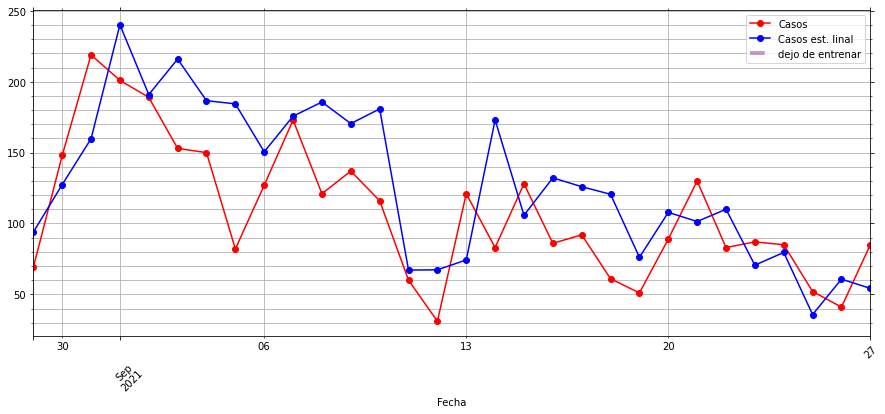

(-1.0638966864239516, 104.15044647808392)

In [88]:
kkk =estimadorCasos(entrenoDesde = '2020-09-22',
    entrenoHasta = '2021-04-29')
kkk

In [89]:
for i in total.iloc[-200:-7].index:
    kkk =estimadorCasos(entrenoDesde = i,
    entrenoHasta = '2021-04-29',plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-03-13 00:00:00 8.928253083581977 105.12291678672399
2021-03-14 00:00:00 9.908348373077313 105.68990713573785
2021-03-15 00:00:00 9.517624016015056 105.27775131239981
2021-03-16 00:00:00 10.919270938323148 105.97899839380459
2021-03-17 00:00:00 13.158575801648553 107.7550329449616
2021-03-18 00:00:00 5.781724448938109 104.27674875814466
2021-03-19 00:00:00 2.968234479651386 104.1305043249432
2021-03-20 00:00:00 4.707676742156552 104.87192803965132
2021-03-21 00:00:00 7.878484427288701 107.50923388458286
2021-03-22 00:00:00 6.761203620751773 106.47445350027144
2021-03-23 00:00:00 7.898216806536743 107.261706677219
2021-03-24 00:00:00 6.8292557909696905 106.49547093477427
2021-03-25 00:00:00 8.459512298291639 107.8420561417179
2021-03-26 00:00:00 9.691257378734035 109.63910970388244
2021-03-27 00:00:00 15.24978071690772 116.62804070193128
2021-03-28 00:00:00 16.294263586326498 121.36277852541865
2021-03-29 00:00:00 15.880861054833874 119.54902258947932
2021-03-30 00:00:00 15.77466682

2021-08-03 00:00:00 341.55036855036855 265.74837499303766
2021-08-04 00:00:00 341.55036855036855 265.74837499303766
2021-08-05 00:00:00 341.55036855036855 265.74837499303766
2021-08-06 00:00:00 341.55036855036855 265.74837499303766
2021-08-07 00:00:00 341.55036855036855 265.74837499303766
2021-08-08 00:00:00 341.55036855036855 265.74837499303766
2021-08-09 00:00:00 341.55036855036855 265.74837499303766
2021-08-10 00:00:00 341.55036855036855 265.74837499303766
2021-08-11 00:00:00 341.55036855036855 265.74837499303766
2021-08-12 00:00:00 341.55036855036855 265.74837499303766
2021-08-13 00:00:00 341.55036855036855 265.74837499303766
2021-08-14 00:00:00 341.55036855036855 265.74837499303766
2021-08-15 00:00:00 341.55036855036855 265.74837499303766
2021-08-16 00:00:00 341.55036855036855 265.74837499303766
2021-08-17 00:00:00 341.55036855036855 265.74837499303766
2021-08-18 00:00:00 341.55036855036855 265.74837499303766
2021-08-19 00:00:00 341.55036855036855 265.74837499303766
2021-08-20 00:

In [90]:
for i in total.iloc[-76:-3].index:
    kkk =estimadorCasos(entrenoDesde = '2021-03-19',
    entrenoHasta = i,plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-07-15 00:00:00 -7.297682390517027 106.50512559825746
2021-07-16 00:00:00 -1.3842944625526041 105.52141668226922
2021-07-17 00:00:00 -2.1453279726071703 105.3510757520922
2021-07-18 00:00:00 -6.704948729973448 105.30913233224932
2021-07-19 00:00:00 -10.747802869284591 106.61003081593154
2021-07-20 00:00:00 -9.892011332404188 106.36831904916693
2021-07-21 00:00:00 -11.53135040719345 106.81761625383757
2021-07-22 00:00:00 -10.906839067203267 106.64868029005876
2021-07-23 00:00:00 -2.489799915351189 104.69901634878359
2021-07-24 00:00:00 -1.38702155034478 104.70396475051719
2021-07-25 00:00:00 -2.6732541114428616 104.63173359090139
2021-07-26 00:00:00 -6.381222029553845 105.3183139190513
2021-07-27 00:00:00 -6.682971790903736 105.37563170511653
2021-07-28 00:00:00 -6.318952886691209 105.3475609903498
2021-07-29 00:00:00 -6.532489119603989 105.37203171546595
2021-07-30 00:00:00 -3.664380435757871 104.87157516440176
2021-07-31 00:00:00 -2.792644134999712 105.03610855172661
2021-08-01 00

In [91]:
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Nº de pacientes a los que se ha realizado pruebas,2387.0,1223.0,837.0,2679.0,2347.0,2346.0,2074.0,2074.0,2818.0,808.0,...,3008.0,2619.0,2718.0,963.0,1624.0,1051.0,3510.0,3284.0,3099.0,2125.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


Fecha,2021-06-24,2021-06-25,2021-06-26,2021-06-27,2021-06-28,2021-06-29,2021-06-30,2021-07-01,2021-07-02,2021-07-03,...,2021-09-15,2021-09-16,2021-09-17,2021-09-18,2021-09-19,2021-09-20,2021-09-21,2021-09-22,2021-09-23,2021-09-24
Casos,70.0,98.0,66.0,28.0,68.0,151.0,197.0,225.0,232.0,233.0,...,128.0,86.0,92.0,61.0,51.0,89.0,130.0,83.0,87.0,85.0
test coresp,1610.0,1851.0,1003.0,776.0,1843.0,2233.0,2342.0,2084.0,1798.0,1353.0,...,2352.0,1895.0,2004.0,1477.0,913.0,2203.0,2577.0,2454.0,2279.0,2581.0
Nº de pacientes a los que se ha realizado pruebas,1632.0,1622.0,964.0,836.0,2342.0,2083.0,2209.0,2149.0,1765.0,1039.0,...,2166.0,1981.0,2134.0,994.0,947.0,1938.0,2000.0,1969.0,1717.0,1755.0
Asintomáticos (%),45.0,51.0,52.0,43.0,47.0,44.0,47.0,43.0,17.0,58.0,...,52.0,59.0,50.0,61.0,57.0,61.0,57.0,58.0,62.0,49.0
Casos$^{{-\Delta t}}$,100.0,70.0,98.0,66.0,28.0,68.0,151.0,197.0,225.0,232.0,...,83.0,128.0,86.0,92.0,61.0,51.0,89.0,130.0,83.0,87.0
test coresp$^{{-\Delta t}}$,1874.0,1610.0,1851.0,1003.0,776.0,1843.0,2233.0,2342.0,2084.0,1798.0,...,1988.0,2352.0,1895.0,2004.0,1477.0,913.0,2203.0,2577.0,2454.0,2279.0
Nº de pacientes a los que se ha realizado pruebas$^{{-\Delta t}}$,1959.0,1632.0,1622.0,964.0,836.0,2342.0,2083.0,2209.0,2149.0,1765.0,...,2132.0,2166.0,1981.0,2134.0,994.0,947.0,1938.0,2000.0,1969.0,1717.0
Asintomáticos (%)$^{{-\Delta t}}$,52.0,45.0,51.0,52.0,43.0,47.0,44.0,47.0,43.0,17.0,...,45.0,52.0,59.0,50.0,61.0,57.0,61.0,57.0,58.0,62.0
Casos$^{-2\cdot \Delta t}$,117.0,100.0,70.0,98.0,66.0,28.0,68.0,151.0,197.0,225.0,...,121.0,83.0,128.0,86.0,92.0,61.0,51.0,89.0,130.0,83.0
test coresp$^{-2\cdot \Delta t}$,2196.0,1874.0,1610.0,1851.0,1003.0,776.0,1843.0,2233.0,2342.0,2084.0,...,2092.0,1988.0,2352.0,1895.0,2004.0,1477.0,913.0,2203.0,2577.0,2454.0


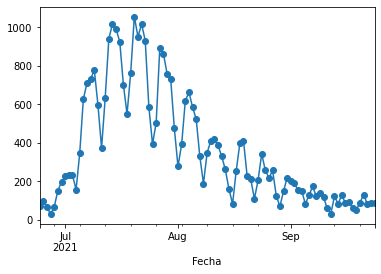

In [92]:
variablesAjuste# = variables
variablesAjuste = ['Casos', 'test coresp', #'Tasa de positividad (%)',
                   'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                   #'Inoculados',
                   #'Total Casos',
                  ]
ventana = 14
entrenoDesde = '2021-06-24'
entrenoHasta = '2021-09-24'
X_total = pd.concat([total.loc[:,variablesAjuste],
                    (total[variablesAjuste].shift(1)
                        #- expData.loc[:,np.concatenate([koopman,estado])]
                    ).add_suffix("$^{{-\Delta t}}$")] + 
                   [ (total[variablesAjuste].shift(i+2) 
                     #-  expData.loc[:,np.concatenate([koopman,estado])]
                     ).add_suffix(
                       "$^{{-{}\cdot \Delta t}}$".format(i+2))
                        for i in range(ventana-2)],axis=1).iloc[ventana-1:].dropna().T#2*ventana]
X_prima_total =total.shift(-1)#.loc[[X.columns],:]
X = X.loc[:,entrenoDesde:entrenoHasta]
##X_prima = X_prima_total.loc[X_total.columns,variablesAjuste].dropna().T
#X_prima = X_prima_total.loc[X_total.columns,['Casos']].dropna().T
X_prima = X_prima_total.loc[entrenoDesde:entrenoHasta,['Casos']].dropna().T
X = X_total.loc[:,X_prima.columns]
X.T.Casos.plot(style='-o')
X

In [93]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Nº de pacientes a los que se ha realizado pruebas$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Nº de pacientes a los que se ha realizado pruebas$^{-11\cdot \Delta t}$,Asintomáticos (%)$^{-11\cdot \Delta t}$,Casos$^{-12\cdot \Delta t}$,test coresp$^{-12\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-12\cdot \Delta t}$,Asintomáticos (%)$^{-12\cdot \Delta t}$,Casos$^{-13\cdot \Delta t}$,test coresp$^{-13\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-13\cdot \Delta t}$,Asintomáticos (%)$^{-13\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-06-24,0.000182,-0.000050,-0.000051,-0.000895,-0.000101,-0.000044,0.000031,0.001439,0.000095,0.000073,...,-0.000046,0.001348,0.000487,-0.000010,-0.000022,-0.000526,-0.000707,0.000086,0.000016,0.002661
2021-06-25,-0.000346,0.000001,0.000075,0.005358,0.000214,-0.000036,-0.000045,-0.000955,-0.000288,-0.000094,...,-0.000032,-0.004376,-0.000275,-0.000072,-0.000003,0.000647,0.000601,-0.000025,-0.000045,-0.000235
2021-06-26,-0.000006,-0.000042,0.000010,-0.001587,-0.000053,0.000014,0.000043,0.004290,0.000048,0.000027,...,0.000042,0.002688,0.000233,0.000095,-0.000022,-0.003548,-0.000279,-0.000024,-0.000024,0.000445
2021-06-27,0.000153,-0.000063,-0.000014,-0.004504,0.000181,-0.000003,0.000019,-0.000711,-0.000418,0.000083,...,0.000033,-0.002171,-0.000550,0.000098,0.000007,0.002873,-0.000598,0.000068,0.000028,-0.003119
2021-06-28,-0.000576,0.000066,0.000039,-0.002447,0.000351,-0.000063,-0.000002,-0.003731,0.000183,-0.000042,...,-0.000031,0.003579,-0.000180,0.000038,0.000051,-0.002349,-0.000530,0.000042,0.000024,0.002124
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-20,-0.000047,0.000048,-0.000010,0.001181,0.000486,0.000002,-0.000051,-0.001273,-0.000424,-0.000011,...,-0.000046,-0.001037,-0.000300,-0.000087,0.000068,0.002287,0.000136,0.000042,0.000017,-0.001325
2021-09-21,-0.000125,0.000062,-0.000015,0.002325,-0.000228,0.000029,-0.000017,0.000815,0.000773,-0.000029,...,-0.000073,-0.004158,-0.000025,-0.000047,-0.000017,-0.001018,0.000236,-0.000061,0.000041,0.001994
2021-09-22,-0.000550,0.000058,-0.000035,0.000204,0.000374,0.000029,0.000030,0.000862,-0.000331,0.000065,...,-0.000032,0.001749,0.000245,0.000072,-0.000067,-0.005090,0.000009,-0.000049,-0.000003,0.000211


In [94]:
A = X_prima.dot( X_pinv)
A
#X_prima

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Nº de pacientes a los que se ha realizado pruebas$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Nº de pacientes a los que se ha realizado pruebas$^{-11\cdot \Delta t}$,Asintomáticos (%)$^{-11\cdot \Delta t}$,Casos$^{-12\cdot \Delta t}$,test coresp$^{-12\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-12\cdot \Delta t}$,Asintomáticos (%)$^{-12\cdot \Delta t}$,Casos$^{-13\cdot \Delta t}$,test coresp$^{-13\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-13\cdot \Delta t}$,Asintomáticos (%)$^{-13\cdot \Delta t}$
Casos,1.170302,-0.067182,0.057879,-2.472086,-0.350101,0.070107,-0.10924,0.267619,0.281036,-0.004954,...,-0.000805,-0.57483,-0.018554,-0.000851,0.002664,1.806293,-0.504337,0.078641,-0.017793,0.234533


In [95]:
def verPrevision(fecha=['2021-05-07'],debug=False,A=A,X=X):
    dato = X_total.loc[:,X_total.columns.intersection(pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D'))]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    #prevision.index = ['Casos est. lineal']
    prevision.index = ["{} est. lineal".format(i) for i in prevision.index]
    return prevision.T
verPrevision(A=A,debug=True)

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Nº de pacientes a los que se ha realizado pruebas$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Nº de pacientes a los que se ha realizado pruebas$^{-11\cdot \Delta t}$,Asintomáticos (%)$^{-11\cdot \Delta t}$,Casos$^{-12\cdot \Delta t}$,test coresp$^{-12\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-12\cdot \Delta t}$,Asintomáticos (%)$^{-12\cdot \Delta t}$,Casos$^{-13\cdot \Delta t}$,test coresp$^{-13\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-13\cdot \Delta t}$,Asintomáticos (%)$^{-13\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-06,257.0,3093.0,2641.0,48.0,334.0,3634.0,3070.0,48.0,370.0,4377.0,...,1051.0,50.0,152.0,1599.0,1624.0,54.0,245.0,2456.0,963.0,55.0


,Casos est. lineal
Fecha,
2021-05-07,254.938026


In [96]:
Casos =  total.loc[entrenoDesde:,'Casos'].dropna()
#Casos =  total.loc['2021-01':,'Casos'].dropna()


Casos.iloc[5:]

Fecha
2021-06-29    151.0
2021-06-30    197.0
2021-07-01    225.0
2021-07-02    232.0
2021-07-03    233.0
              ...  
2021-09-23     87.0
2021-09-24     85.0
2021-09-25     52.0
2021-09-26     41.0
2021-09-27     85.0
Name: Casos, Length: 91, dtype: float64

In [97]:
verPrevision(Casos.iloc[5:].index,A=A,X=X)

,Casos est. lineal
Fecha,
2021-06-29,135.097739
2021-06-30,224.782835
2021-07-01,199.375844
2021-07-02,237.702343
2021-07-03,195.398093
...,...
2021-09-23,53.471048
2021-09-24,59.676364
2021-09-25,47.532202


In [98]:
#Casos = total.loc['2020-09-01':,['Casos']].dropna()
Casos = pd.concat([Casos.iloc[5:],verPrevision(Casos.iloc[5:].index,A=A,X=X)],axis=1)
ultimaPrevision = verPrevision(fecha=['2021-09-22'])
Casos.loc[ultimaPrevision.index[0],'Casos est. lineal'] = ultimaPrevision.iat[0,0]
Casos


,Casos,Casos est. lineal
Fecha,,
2021-06-29,151.0,135.097739
2021-06-30,197.0,224.782835
2021-07-01,225.0,199.375844
2021-07-02,232.0,237.702343
2021-07-03,233.0,195.398093
...,...,...
2021-09-23,87.0,53.471048
2021-09-24,85.0,59.676364
2021-09-25,52.0,47.532202


In [99]:
Casos.index[0]#+ pd.Timedelta(7,unit='D')

Timestamp('2021-06-29 00:00:00')

,Casos,Casos est. lineal,Casos DMDc
2021-09-21,130.0,119.594526,100.025638
2021-09-22,83.0,149.598516,91.514566
2021-09-23,87.0,53.471048,84.193797
2021-09-24,85.0,59.676364,70.611486
2021-09-25,52.0,47.532202,46.642417
2021-09-26,41.0,64.059487,25.989314
2021-09-27,85.0,57.658136,33.562963
2021-09-28,NaN,NaN,39.193973
2021-09-29,NaN,NaN,31.231094
2021-09-30,NaN,NaN,25.945431


(1.5990312959975275, 38.774039959505934)

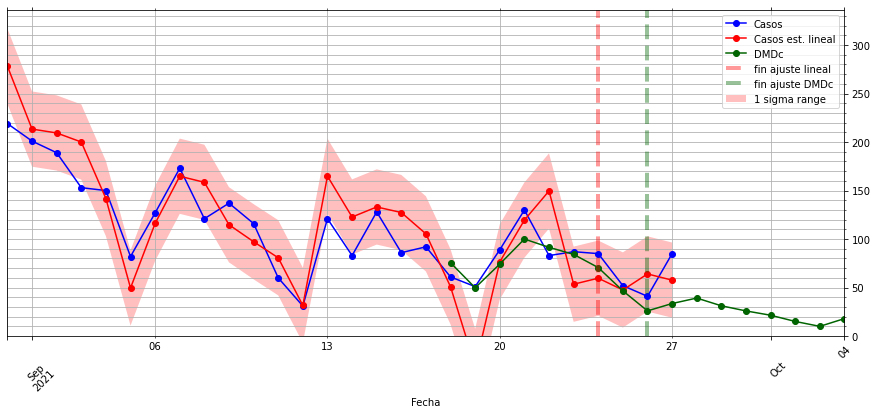

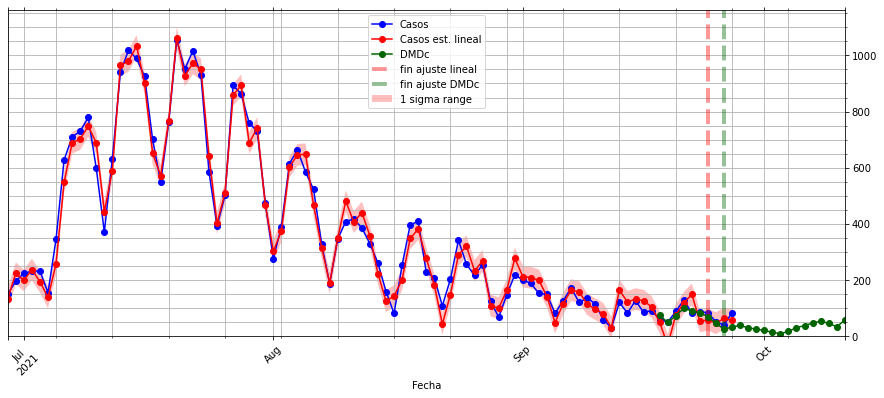

In [100]:
errorSTD = ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-35:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-28:].index, 
                Casos.iloc[-28:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-28:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(14,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-156:].index, 
                Casos.iloc[-156:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-156:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')


plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')

Ajustes = pd.concat([Casos,kControl2.T.loc[Casos.index[-7]:,['Casos']].iloc[:11,:].rename(columns={'Casos':'Casos DMDc'})],axis=1).tail(11)
display(Ajustes)
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

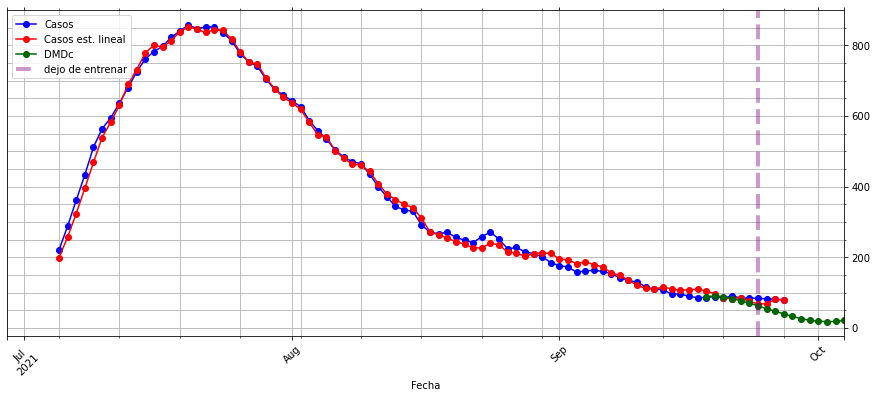

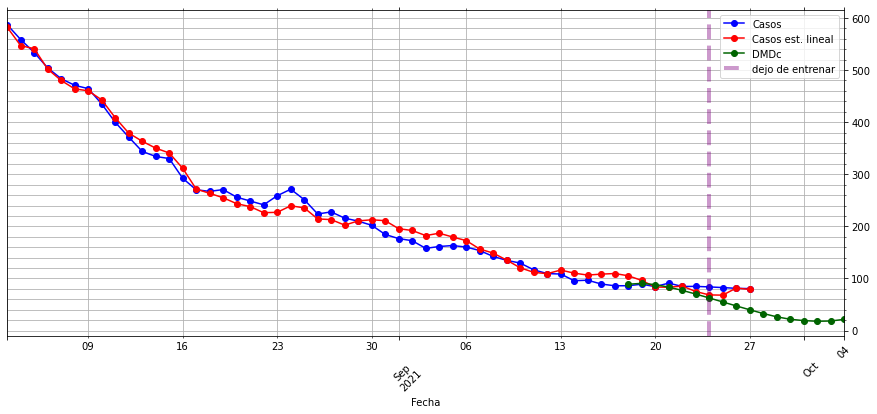

In [101]:
#goto
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
             ].iloc[-21:].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-56:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-50:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')

In [102]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(1.5990312959975275, 38.774039959505934)

In [103]:
colores = plt.cm.tab20b.colors
colores = dict(zip(U_hat_r.index,plt.cm.tab20b.colors + plt.cm.Pastel1.colors[:6]))

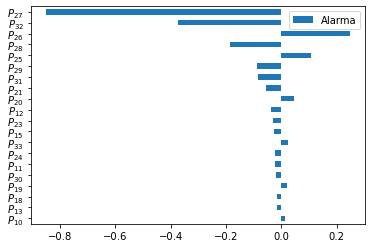

In [104]:
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

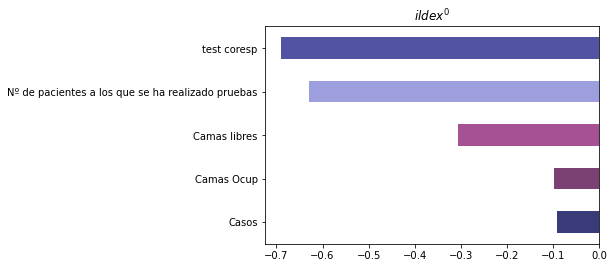

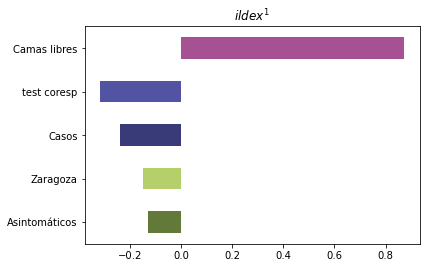

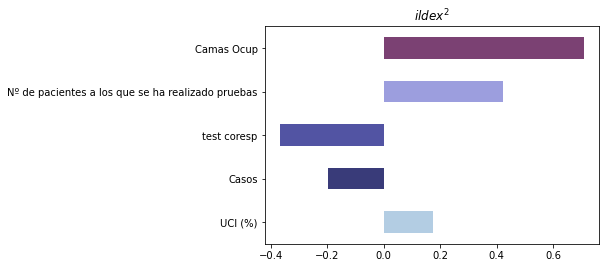

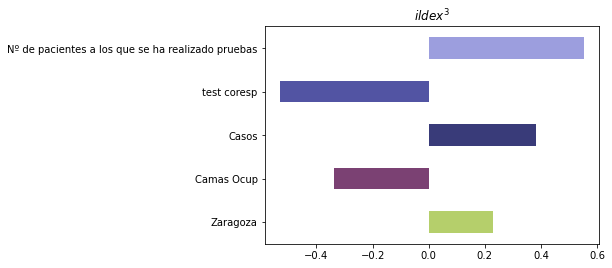

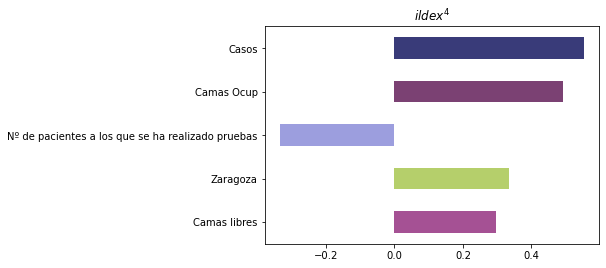

...

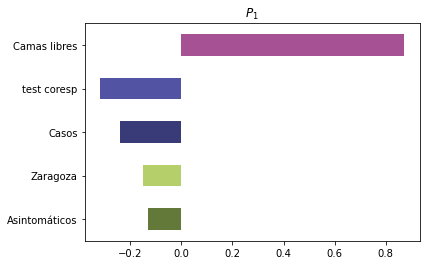

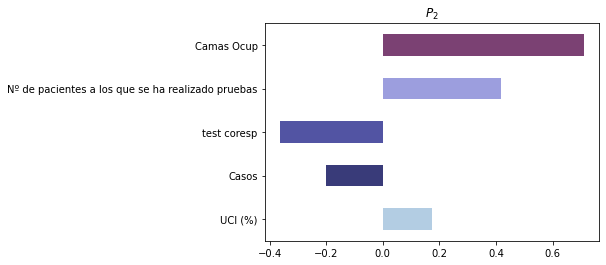

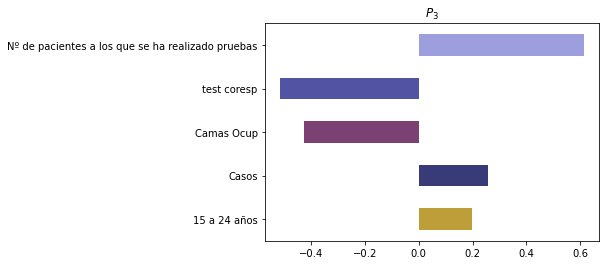

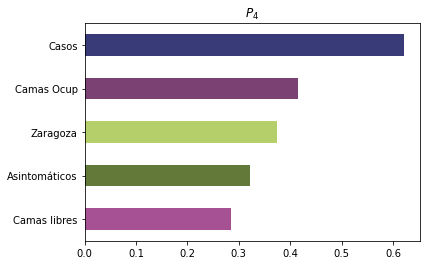

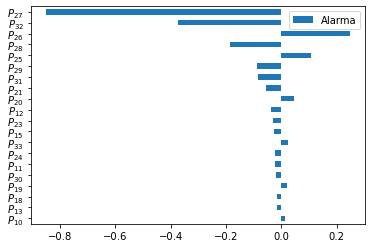

KeyError: 'Total Casos 75 años o más'

In [105]:
for i in U_hat_r.columns[:5]: 
    componentes = U_hat_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
for i in U_tilde_1_r.columns[:5]: 
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

for i in U_tilde_2_r.T.sort_values(by='Alarma',key=abs).loc[::-1].head(10).index:
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()

In [ ]:
diario.Alarma.sort_index(ascending=False).to_excel("kk.xlsx")

In [ ]:
len(fsys_A_tilde.B),len(fsys_A_tilde.B[0])

In [ ]:
ktf= ct.ss2tf(fsys_A_tilde)

In [ ]:
diario.Casos.dtype?


In [ ]:
df = pd.DataFrame(index=[1,2,4])
df

In [ ]:

df.loc[:,'error'] = [[1,2],[2,3],[3,4]]

In [ ]:
df.loc[3,'error'] = range(3)
df

In [ ]:
df.dtypes